In [1]:
import pandas as pd
import numpy as np


In [2]:
!pip install /kaggle/input/pip-install-lifelines/autograd-1.7.0-py3-none-any.whl
!pip install /kaggle/input/pip-install-lifelines/autograd-gamma-0.5.0.tar.gz
!pip install /kaggle/input/pip-install-lifelines/interface_meta-1.3.0-py3-none-any.whl
!pip install /kaggle/input/pip-install-lifelines/formulaic-1.0.2-py3-none-any.whl
!pip install /kaggle/input/pip-install-lifelines/lifelines-0.30.0-py3-none-any.whl

Processing /kaggle/input/pip-install-lifelines/autograd-1.7.0-py3-none-any.whl
autograd is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.
Processing /kaggle/input/pip-install-lifelines/autograd-gamma-0.5.0.tar.gz
  Preparing metadata (setup.py) ... done
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4031 sha256=1f6d64206ba42ee4cac71636ae6ae7a299a54214507da4874900640786847a99
  Stored in directory: /root/.cache/pip/wheels/6b/b5/e0/4c79e15c0b5f2c15ecf613c720bb20daab20a666eb67135155
Successfully built autograd-gamma
Processing /kaggle/input/pip-install-lifelines/interface_meta-1.3.0-py3-none-any.whl
Processing /kaggle/input/pip-install-lifelines/formulaic-1.0.2-py3-none-any.whl
Processing /kaggle/input/pip-install-lifelines/lifelines-0.30.0-py3-none-any.whl


In [3]:
from lifelines import KaplanMeierFitter

### lets use Kaplier Mier Curve in order to calculate Survival Probabilities. 
### credit to https://www.kaggle.com/code/cdeotte/gpu-lightgbm-baseline-cv-681-lb-685

In [4]:
df_train  = pd.read_csv("/kaggle/input/equity-post-HCT-survival-predictions/train.csv")
df_train.head()

,ID,dri_score,psych_disturb,cyto_score,diabetes,hla_match_c_high,hla_high_res_8,tbi_status,arrhythmia,hla_low_res_6,...,tce_div_match,donor_related,melphalan_dose,hla_low_res_8,cardiac,hla_match_drb1_high,pulm_moderate,hla_low_res_10,efs,efs_time
0,0,N/A - non-malignant indication,No,NaN,No,NaN,NaN,No TBI,No,6.0,...,NaN,Unrelated,"N/A, Mel not given",8.0,No,2.0,No,10.0,0.0,42.356
1,1,Intermediate,No,Intermediate,No,2.0,8.0,"TBI +- Other, >cGy",No,6.0,...,Permissive mismatched,Related,"N/A, Mel not given",8.0,No,2.0,Yes,10.0,1.0,4.672
2,2,N/A - non-malignant indication,No,NaN,No,2.0,8.0,No TBI,No,6.0,...,Permissive mismatched,Related,"N/A, Mel not given",8.0,No,2.0,No,10.0,0.0,19.793
3,3,High,No,Intermediate,No,2.0,8.0,No TBI,No,6.0,...,Permissive mismatched,Unrelated,"N/A, Mel not given",8.0,No,2.0,No,10.0,0.0,102.349
4,4,High,No,NaN,No,2.0,8.0,No TBI,No,6.0,...,Permissive mismatched,Related,MEL,8.0,No,2.0,No,10.0,0.0,16.223


In [5]:
df_train.shape

(28800, 60)

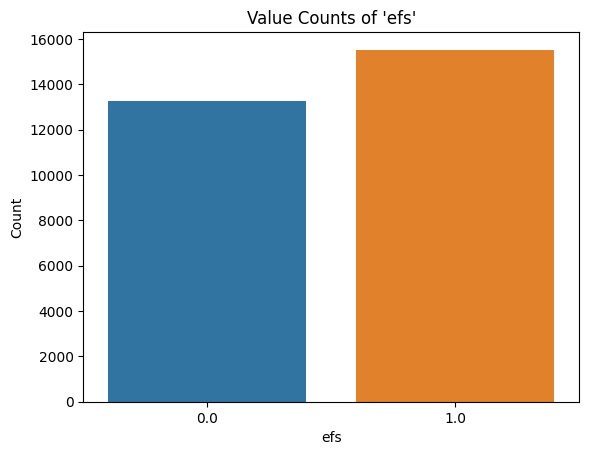

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_train is defined and has a column 'efs'
x = df_train['efs'].value_counts()

# Convert the value_counts() Series to a DataFrame for easier plotting
x = x.reset_index()
x.columns = ['efs', 'count']

# Create the barplot
sns.barplot(data=x, x='efs', y='count')

# Customize the plot
plt.title("Value Counts of 'efs'")
plt.xlabel("efs")
plt.ylabel("Count")
plt.show()

In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28800 entries, 0 to 28799
Data columns (total 60 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      28800 non-null  int64  
 1   dri_score               28646 non-null  object 
 2   psych_disturb           26738 non-null  object 
 3   cyto_score              20732 non-null  object 
 4   diabetes                26681 non-null  object 
 5   hla_match_c_high        24180 non-null  float64
 6   hla_high_res_8          22971 non-null  float64
 7   tbi_status              28800 non-null  object 
 8   arrhythmia              26598 non-null  object 
 9   hla_low_res_6           25530 non-null  float64
 10  graft_type              28800 non-null  object 
 11  vent_hist               28541 non-null  object 
 12  renal_issue             26885 non-null  object 
 13  pulm_severe             26665 non-null  object 
 14  prim_disease_hct        28800 non-null

In [8]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df_train, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
df_test = pd.read_csv("/kaggle/input/equity-post-HCT-survival-predictions/test.csv")
df_test.head()

,ID,dri_score,psych_disturb,cyto_score,diabetes,hla_match_c_high,hla_high_res_8,tbi_status,arrhythmia,hla_low_res_6,...,karnofsky_score,hepatic_mild,tce_div_match,donor_related,melphalan_dose,hla_low_res_8,cardiac,hla_match_drb1_high,pulm_moderate,hla_low_res_10
0,28800,N/A - non-malignant indication,No,NaN,No,NaN,NaN,No TBI,No,6.0,...,90.0,No,NaN,Unrelated,"N/A, Mel not given",8.0,No,2.0,No,10.0
1,28801,Intermediate,No,Intermediate,No,2.0,8.0,"TBI +- Other, >cGy",No,6.0,...,90.0,No,Permissive mismatched,Related,"N/A, Mel not given",8.0,No,2.0,Yes,10.0
2,28802,N/A - non-malignant indication,No,NaN,No,2.0,8.0,No TBI,No,6.0,...,90.0,No,Permissive mismatched,Related,"N/A, Mel not given",8.0,No,2.0,No,10.0


In [10]:
cols = df_test.columns


In [11]:
df_train.drop(columns = 'ID' , inplace = True)

df_test.drop(columns = 'ID' , inplace = True)

In [12]:
# ## removing variables that are high in missing values 
# filter  = df_train.columns[df_train.isna().sum() < 2500]
# df_train = df_train[filter]


In [13]:
## removing na values
# df_train.dropna(inplace = True)
# df_train.shape


In [14]:
categorical_columns = df_train.select_dtypes('object').columns

In [15]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder

# Function to ensure column names are unique
def make_column_names_unique(df):
    col_counts = {}
    new_columns = []
    for col in df.columns:
        clean_col = col  # Store original name
        if clean_col in col_counts:
            col_counts[clean_col] += 1
            new_columns.append(f"{clean_col}_{col_counts[clean_col]}")  # Append suffix for duplicates
        else:
            col_counts[clean_col] = 0
            new_columns.append(clean_col)
    df.columns = new_columns
    return df

# One-hot encode train data
encoder = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')  
encoded_array_train = encoder.fit_transform(df_train[categorical_columns])
encoded_columns_train = [f"{col}_{category}" for col, categories in zip(categorical_columns, encoder.categories_) for category in categories[1:]]

# Convert to DataFrame
encoded_df_train = pd.DataFrame(encoded_array_train, columns=encoded_columns_train)

# Combine with the original train data (dropping categorical columns)
df_train_encoded = pd.concat([df_train.drop(categorical_columns, axis=1).reset_index(drop=True), 
                              encoded_df_train.reset_index(drop=True)], axis=1)

# Ensure valid column names
df_train_encoded.columns = df_train_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)
df_train_encoded = make_column_names_unique(df_train_encoded)  # Fix duplicate names


### **One-hot encode test data (using same encoder)**
encoded_array_test = encoder.transform(df_test[categorical_columns])
encoded_df_test = pd.DataFrame(encoded_array_test, columns=encoded_columns_train)  # Use train's column names

# Function to strictly align test encoded data with train's columns
def align_encoded_columns(encoded_df, reference_columns):
    # Ensure test has all train's columns
    for col in reference_columns:
        if col not in encoded_df:
            encoded_df[col] = 0  # Fill missing columns with 0

    # Keep only train's columns (drop unexpected extra ones)
    encoded_df = encoded_df[reference_columns]
    
    return encoded_df

# Align test encoded data strictly to match train
encoded_df_test_aligned = align_encoded_columns(encoded_df_test, encoded_columns_train)

# Combine with original test data (dropping categorical columns)
df_test_encoded = pd.concat([df_test.drop(categorical_columns, axis=1).reset_index(drop=True), 
                             encoded_df_test_aligned.reset_index(drop=True)], axis=1)

# Ensure valid column names
df_test_encoded.columns = df_test_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)
df_test_encoded = make_column_names_unique(df_test_encoded)  # Fix duplicate names


In [16]:
df_train_encoded.shape

(28800, 180)

In [17]:
df_test_encoded.shape

(3, 178)

In [18]:
cols = df_train_encoded.columns.difference(['efs' , 'efs_time'])
df_test_encoded[cols]

,age_at_hct,arrhythmia_Not_done,arrhythmia_Yes,arrhythmia_nan,cardiac_Not_done,cardiac_Yes,cardiac_nan,cmv_status__,cmv_status___1,cmv_status___2,...,tce_imm_match_P_H,tce_imm_match_P_P,tce_imm_match_nan,tce_match_GvH_non_permissive,tce_match_HvG_non_permissive,tce_match_Permissive,tce_match_nan,vent_hist_Yes,vent_hist_nan,year_hct
0,9.942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,2016
1,43.705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2008
2,33.997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2019


In [19]:
df_train_encoded.columns = df_train_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)
df_test_encoded.columns = df_test_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)

In [20]:
cmv_status_columns = [col for col in df_train_encoded.columns if col.startswith('cmv_status__')]
print("Columns starting with 'cmv_status__':", cmv_status_columns)


Columns starting with 'cmv_status__': ['cmv_status__', 'cmv_status___1', 'cmv_status___2']


In [21]:
import gc
gc.collect()

993532

In [22]:
## lets separate data for building two models for classification for efs and regression for efs_rate 

from sklearn.model_selection import train_test_split
x_vars  = df_train_encoded.columns.difference(['efs' , 'efs_time'])
trainx , testx , trainy , testy  = train_test_split(df_train_encoded[x_vars] , df_train_encoded['efs'].astype('int')  , random_state = 0 , test_size = 0.25)
print(trainx.shape)
print(testx.shape)
print(trainy.shape)
print(testy.shape)

(21600, 178)
(7200, 178)
(21600,)
(7200,)


In [23]:
import gc
gc.collect()

0

In [24]:
# Optuna objective function

import lightgbm as lgb
import optuna
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")



def objective(trial):
    params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'device' : 'gpu' ,
        'n_estimators': trial.suggest_int("n_estimators", 10 , 600),
        'max_depth': trial.suggest_int('max_depth', 2, 12),
        'num_leaves': trial.suggest_int('num_leaves', 21, 150),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.5, log=True),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.6, 1.0),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
        'min_split_gain': trial.suggest_float('min_split_gain', 0.0, 0.5),
        
    }


    # Initialize the LightGBM model
    model = lgb.LGBMClassifier(**params)
    model.fit(trainx, trainy)

    # Make predictions
    preds = model.predict(testx)
    acc_score = accuracy_score(testy, preds)
    return acc_score

# Run the study
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50 , timeout=1800)







[I 2025-02-04 14:58:10,940] A new study created in memory with name: no-name-b7c85e0a-9b50-4fe5-8744-4ae986009218


[LightGBM] [Warning] feature_fraction is set=0.9037687488424944, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9037687488424944
[LightGBM] [Warning] lambda_l2 is set=5.973797560688093e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.973797560688093e-08
[LightGBM] [Warning] lambda_l1 is set=4.9889713045201175e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9889713045201175e-05
[LightGBM] [Warning] feature_fraction is set=0.9037687488424944, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9037687488424944
[LightGBM] [Warning] lambda_l2 is set=5.973797560688093e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.973797560688093e-08
[LightGBM] [Warning] lambda_l1 is set=4.9889713045201175e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9889713045201175e-05
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info

[I 2025-02-04 14:58:17,388] Trial 0 finished with value: 0.6751388888888888 and parameters: {'n_estimators': 144, 'max_depth': 7, 'num_leaves': 130, 'learning_rate': 0.011521563101904192, 'feature_fraction': 0.9037687488424944, 'min_child_samples': 37, 'lambda_l1': 4.9889713045201175e-05, 'lambda_l2': 5.973797560688093e-08, 'min_split_gain': 0.23187168673797554}. Best is trial 0 with value: 0.6751388888888888.


[LightGBM] [Warning] feature_fraction is set=0.9037687488424944, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9037687488424944
[LightGBM] [Warning] lambda_l2 is set=5.973797560688093e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.973797560688093e-08
[LightGBM] [Warning] lambda_l1 is set=4.9889713045201175e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9889713045201175e-05
[LightGBM] [Warning] feature_fraction is set=0.834485014426933, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.834485014426933
[LightGBM] [Warning] lambda_l2 is set=0.0015964218519518446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015964218519518446
[LightGBM] [Warning] lambda_l1 is set=2.0299610178507162e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0299610178507162e-08
[LightGBM] [Warning] feature_fraction is set=0.834485014426933, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[I 2025-02-04 14:58:18,861] Trial 1 finished with value: 0.6934722222222223 and parameters: {'n_estimators': 243, 'max_depth': 9, 'num_leaves': 32, 'learning_rate': 0.027103228654988275, 'feature_fraction': 0.834485014426933, 'min_child_samples': 96, 'lambda_l1': 2.0299610178507162e-08, 'lambda_l2': 0.0015964218519518446, 'min_split_gain': 0.12916203510885121}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.834485014426933, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.834485014426933
[LightGBM] [Warning] lambda_l2 is set=0.0015964218519518446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015964218519518446
[LightGBM] [Warning] lambda_l1 is set=2.0299610178507162e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0299610178507162e-08
[LightGBM] [Warning] feature_fraction is set=0.7627900588398615, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7627900588398615
[LightGBM] [Warning] lambda_l2 is set=2.315710654995574e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.315710654995574e-08
[LightGBM] [Warning] lambda_l1 is set=4.394403391824926e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.394403391824926e-08
[LightGBM] [Warning] feature_fraction is set=0.7627900588398615, colsample_bytree=1.0 will be ignored. Current value: feature_fraction

[I 2025-02-04 14:58:20,357] Trial 2 finished with value: 0.6927777777777778 and parameters: {'n_estimators': 406, 'max_depth': 5, 'num_leaves': 28, 'learning_rate': 0.07777672259986639, 'feature_fraction': 0.7627900588398615, 'min_child_samples': 99, 'lambda_l1': 4.394403391824926e-08, 'lambda_l2': 2.315710654995574e-08, 'min_split_gain': 0.13177051336740936}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.7627900588398615, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7627900588398615
[LightGBM] [Warning] lambda_l2 is set=2.315710654995574e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.315710654995574e-08
[LightGBM] [Warning] lambda_l1 is set=4.394403391824926e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.394403391824926e-08
[LightGBM] [Warning] feature_fraction is set=0.9508750560183561, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9508750560183561
[LightGBM] [Warning] lambda_l2 is set=0.19939397074265341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19939397074265341
[LightGBM] [Warning] lambda_l1 is set=0.009800641210720724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009800641210720724
[LightGBM] [Warning] feature_fraction is set=0.9508750560183561, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.950

[I 2025-02-04 14:58:20,901] Trial 3 finished with value: 0.67875 and parameters: {'n_estimators': 131, 'max_depth': 3, 'num_leaves': 83, 'learning_rate': 0.04531050536631061, 'feature_fraction': 0.9508750560183561, 'min_child_samples': 27, 'lambda_l1': 0.009800641210720724, 'lambda_l2': 0.19939397074265341, 'min_split_gain': 0.08443701338698445}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.8562493085718046, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8562493085718046
[LightGBM] [Warning] lambda_l2 is set=4.077622557312754e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.077622557312754e-08
[LightGBM] [Warning] lambda_l1 is set=0.0002444405686161847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002444405686161847
[LightGBM] [Warning] feature_fraction is set=0.8562493085718046, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8562493085718046
[LightGBM] [Warning] lambda_l2 is set=4.077622557312754e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.077622557312754e-08
[LightGBM] [Warning] lambda_l1 is set=0.0002444405686161847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002444405686161847
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] To

[I 2025-02-04 14:58:21,441] Trial 4 finished with value: 0.685 and parameters: {'n_estimators': 141, 'max_depth': 3, 'num_leaves': 83, 'learning_rate': 0.08016056461903227, 'feature_fraction': 0.8562493085718046, 'min_child_samples': 18, 'lambda_l1': 0.0002444405686161847, 'lambda_l2': 4.077622557312754e-08, 'min_split_gain': 0.316306154136377}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-02-04 14:58:21,825] Trial 5 finished with value: 0.6838888888888889 and parameters: {'n_estimators': 75, 'max_depth': 2, 'num_leaves': 48, 'learning_rate': 0.2116520128708167, 'feature_fraction': 0.9223594933563077, 'min_child_samples': 85, 'lambda_l1': 0.018662467004965287, 'lambda_l2': 8.946469321395753e-08, 'min_split_gain': 0.07356688848154896}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.9223594933563077, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9223594933563077
[LightGBM] [Warning] lambda_l2 is set=8.946469321395753e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.946469321395753e-08
[LightGBM] [Warning] lambda_l1 is set=0.018662467004965287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018662467004965287
[LightGBM] [Warning] feature_fraction is set=0.9437853137584538, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9437853137584538
[LightGBM] [Warning] lambda_l2 is set=0.0015831819805678337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015831819805678337
[LightGBM] [Warning] lambda_l1 is set=0.0024990996627524127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024990996627524127
[LightGBM] [Warning] feature_fraction is set=0.9437853137584538, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0

[I 2025-02-04 14:58:26,199] Trial 6 finished with value: 0.6823611111111111 and parameters: {'n_estimators': 532, 'max_depth': 8, 'num_leaves': 89, 'learning_rate': 0.08208445994429533, 'feature_fraction': 0.9437853137584538, 'min_child_samples': 13, 'lambda_l1': 0.0024990996627524127, 'lambda_l2': 0.0015831819805678337, 'min_split_gain': 0.057030870818947366}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.7914401328915273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7914401328915273
[LightGBM] [Warning] lambda_l2 is set=0.043677029445902474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043677029445902474
[LightGBM] [Warning] lambda_l1 is set=0.0012807334701310288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012807334701310288
[LightGBM] [Warning] feature_fraction is set=0.7914401328915273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7914401328915273
[LightGBM] [Warning] lambda_l2 is set=0.043677029445902474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043677029445902474
[LightGBM] [Warning] lambda_l1 is set=0.0012807334701310288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012807334701310288
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total 

[I 2025-02-04 14:58:29,648] Trial 7 finished with value: 0.6879166666666666 and parameters: {'n_estimators': 585, 'max_depth': 10, 'num_leaves': 109, 'learning_rate': 0.04183857055126797, 'feature_fraction': 0.7914401328915273, 'min_child_samples': 17, 'lambda_l1': 0.0012807334701310288, 'lambda_l2': 0.043677029445902474, 'min_split_gain': 0.40039323961683154}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.7914401328915273, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7914401328915273
[LightGBM] [Warning] lambda_l2 is set=0.043677029445902474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043677029445902474
[LightGBM] [Warning] lambda_l1 is set=0.0012807334701310288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012807334701310288
[LightGBM] [Warning] feature_fraction is set=0.7323424025911189, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7323424025911189
[LightGBM] [Warning] lambda_l2 is set=1.6613791517918203e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6613791517918203e-05
[LightGBM] [Warning] lambda_l1 is set=1.0584948039202772e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0584948039202772e-06
[LightGBM] [Warning] feature_fraction is set=0.7323424025911189, colsample_bytree=1.0 will be ignored. Current value: feature_fracti

[I 2025-02-04 14:58:30,694] Trial 8 finished with value: 0.6873611111111111 and parameters: {'n_estimators': 505, 'max_depth': 2, 'num_leaves': 50, 'learning_rate': 0.0554364361348825, 'feature_fraction': 0.7323424025911189, 'min_child_samples': 69, 'lambda_l1': 1.0584948039202772e-06, 'lambda_l2': 1.6613791517918203e-05, 'min_split_gain': 0.09373104142363153}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.7323424025911189, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7323424025911189
[LightGBM] [Warning] lambda_l2 is set=1.6613791517918203e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6613791517918203e-05
[LightGBM] [Warning] lambda_l1 is set=1.0584948039202772e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0584948039202772e-06
[LightGBM] [Warning] feature_fraction is set=0.7861534007107067, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7861534007107067
[LightGBM] [Warning] lambda_l2 is set=0.32507338529397467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32507338529397467
[LightGBM] [Warning] lambda_l1 is set=1.014443070239484e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014443070239484e-08
[LightGBM] [Warning] feature_fraction is set=0.7861534007107067, colsample_bytree=1.0 will be ignored. Current value: feature_fraction

[I 2025-02-04 14:58:31,904] Trial 9 finished with value: 0.6901388888888889 and parameters: {'n_estimators': 567, 'max_depth': 8, 'num_leaves': 24, 'learning_rate': 0.18213331161272273, 'feature_fraction': 0.7861534007107067, 'min_child_samples': 40, 'lambda_l1': 1.014443070239484e-08, 'lambda_l2': 0.32507338529397467, 'min_split_gain': 0.3924860989959846}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-02-04 14:58:34,496] Trial 10 finished with value: 0.6873611111111111 and parameters: {'n_estimators': 282, 'max_depth': 12, 'num_leaves': 60, 'learning_rate': 0.013994434059805065, 'feature_fraction': 0.661806100193052, 'min_child_samples': 66, 'lambda_l1': 2.8933138583938796, 'lambda_l2': 0.00010473976462887977, 'min_split_gain': 0.20349728535195616}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.661806100193052, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.661806100193052
[LightGBM] [Warning] lambda_l2 is set=0.00010473976462887977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010473976462887977
[LightGBM] [Warning] lambda_l1 is set=2.8933138583938796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8933138583938796
[LightGBM] [Warning] feature_fraction is set=0.6914063914497255, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6914063914497255
[LightGBM] [Warning] lambda_l2 is set=6.598842608718463e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.598842608718463e-06
[LightGBM] [Warning] lambda_l1 is set=1.083856243304148e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083856243304148e-08
[LightGBM] [Warning] feature_fraction is set=0.6914063914497255, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.691

[I 2025-02-04 14:58:35,992] Trial 11 finished with value: 0.6877777777777778 and parameters: {'n_estimators': 373, 'max_depth': 5, 'num_leaves': 22, 'learning_rate': 0.02702723154376684, 'feature_fraction': 0.6914063914497255, 'min_child_samples': 100, 'lambda_l1': 1.083856243304148e-08, 'lambda_l2': 6.598842608718463e-06, 'min_split_gain': 0.17502062884038536}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.6135013476519453, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6135013476519453
[LightGBM] [Warning] lambda_l2 is set=0.0036309951022047895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0036309951022047895
[LightGBM] [Warning] lambda_l1 is set=1.0751492654178926e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0751492654178926e-06
[LightGBM] [Warning] feature_fraction is set=0.6135013476519453, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6135013476519453
[LightGBM] [Warning] lambda_l2 is set=0.0036309951022047895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0036309951022047895
[LightGBM] [Warning] lambda_l1 is set=1.0751492654178926e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0751492654178926e-06
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info

[I 2025-02-04 14:58:37,748] Trial 12 finished with value: 0.6901388888888889 and parameters: {'n_estimators': 314, 'max_depth': 6, 'num_leaves': 36, 'learning_rate': 0.023761165394398168, 'feature_fraction': 0.6135013476519453, 'min_child_samples': 96, 'lambda_l1': 1.0751492654178926e-06, 'lambda_l2': 0.0036309951022047895, 'min_split_gain': 0.15655896366305108}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.8472947240253289, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8472947240253289
[LightGBM] [Warning] lambda_l2 is set=5.455411334089247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455411334089247
[LightGBM] [Warning] lambda_l1 is set=4.4506602508558403e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4506602508558403e-07
[LightGBM] [Warning] feature_fraction is set=0.8472947240253289, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8472947240253289
[LightGBM] [Warning] lambda_l2 is set=5.455411334089247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.455411334089247
[LightGBM] [Warning] lambda_l1 is set=4.4506602508558403e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4506602508558403e-07
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 922

[I 2025-02-04 14:58:40,979] Trial 13 finished with value: 0.6615277777777778 and parameters: {'n_estimators': 420, 'max_depth': 10, 'num_leaves': 63, 'learning_rate': 0.37073361580391667, 'feature_fraction': 0.8472947240253289, 'min_child_samples': 81, 'lambda_l1': 4.4506602508558403e-07, 'lambda_l2': 5.455411334089247, 'min_split_gain': 0.0006507742550844187}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] feature_fraction is set=0.7393403063476539, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7393403063476539
[LightGBM] [Warning] lambda_l2 is set=1.3113636075088242e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3113636075088242e-06
[LightGBM] [Warning] lambda_l1 is set=1.4599564436551935e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4599564436551935e-07
[LightGBM] [Warning] feature_fraction is set=0.7393403063476539, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7393403063476539
[LightGBM] [Warning] lambda_l2 is set=1.3113636075088242e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3113636075088242e-06
[LightGBM] [Warning] lambda_l1 is set=1.4599564436551935e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4599564436551935e-07
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [

[I 2025-02-04 14:58:42,042] Trial 14 finished with value: 0.6919444444444445 and parameters: {'n_estimators': 245, 'max_depth': 5, 'num_leaves': 41, 'learning_rate': 0.12612687176734005, 'feature_fraction': 0.7393403063476539, 'min_child_samples': 59, 'lambda_l1': 1.4599564436551935e-07, 'lambda_l2': 1.3113636075088242e-06, 'min_split_gain': 0.2949708896852328}. Best is trial 1 with value: 0.6934722222222223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-02-04 14:58:45,771] Trial 15 finished with value: 0.6940277777777778 and parameters: {'n_estimators': 443, 'max_depth': 10, 'num_leaves': 145, 'learning_rate': 0.02622581604125923, 'feature_fraction': 0.8453849898466648, 'min_child_samples': 85, 'lambda_l1': 2.021447921127824e-05, 'lambda_l2': 0.00027245290546147713, 'min_split_gain': 0.49661386500847304}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.9969221056969582, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9969221056969582
[LightGBM] [Warning] lambda_l2 is set=0.0003184415811894334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0003184415811894334
[LightGBM] [Warning] lambda_l1 is set=8.205852823052193e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.205852823052193e-06
[LightGBM] [Warning] feature_fraction is set=0.9969221056969582, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9969221056969582
[LightGBM] [Warning] lambda_l2 is set=0.0003184415811894334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0003184415811894334
[LightGBM] [Warning] lambda_l1 is set=8.205852823052193e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.205852823052193e-06
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] To

[I 2025-02-04 14:58:48,552] Trial 16 finished with value: 0.68375 and parameters: {'n_estimators': 217, 'max_depth': 10, 'num_leaves': 150, 'learning_rate': 0.020796285251325448, 'feature_fraction': 0.9969221056969582, 'min_child_samples': 82, 'lambda_l1': 8.205852823052193e-06, 'lambda_l2': 0.0003184415811894334, 'min_split_gain': 0.4580332086550204}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8556830539562306, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8556830539562306
[LightGBM] [Warning] lambda_l2 is set=0.005830185871567268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005830185871567268
[LightGBM] [Warning] lambda_l1 is set=0.3766974802175016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3766974802175016
[LightGBM] [Warning] feature_fraction is set=0.8556830539562306, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8556830539562306
[LightGBM] [Warning] lambda_l2 is set=0.005830185871567268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005830185871567268
[LightGBM] [Warning] lambda_l1 is set=0.3766974802175016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3766974802175016
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 918
[Li

[I 2025-02-04 14:58:52,545] Trial 17 finished with value: 0.6890277777777778 and parameters: {'n_estimators': 349, 'max_depth': 12, 'num_leaves': 114, 'learning_rate': 0.017177116106049106, 'feature_fraction': 0.8556830539562306, 'min_child_samples': 87, 'lambda_l1': 0.3766974802175016, 'lambda_l2': 0.005830185871567268, 'min_split_gain': 0.49328164915149253}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8193591577451482, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8193591577451482
[LightGBM] [Warning] lambda_l2 is set=0.0001212023149760694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001212023149760694
[LightGBM] [Warning] lambda_l1 is set=1.4019766027708085e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4019766027708085e-05
[LightGBM] [Warning] feature_fraction is set=0.8193591577451482, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8193591577451482
[LightGBM] [Warning] lambda_l2 is set=0.0001212023149760694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001212023149760694
[LightGBM] [Warning] lambda_l1 is set=1.4019766027708085e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4019766027708085e-05
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info

[I 2025-02-04 14:58:56,251] Trial 18 finished with value: 0.6902777777777778 and parameters: {'n_estimators': 458, 'max_depth': 9, 'num_leaves': 134, 'learning_rate': 0.03424264103977564, 'feature_fraction': 0.8193591577451482, 'min_child_samples': 69, 'lambda_l1': 1.4019766027708085e-05, 'lambda_l2': 0.0001212023149760694, 'min_split_gain': 0.27990522273771073}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8820648886036452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8820648886036452
[LightGBM] [Warning] lambda_l2 is set=0.024791872194545633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024791872194545633
[LightGBM] [Warning] lambda_l1 is set=9.033216858009268e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.033216858009268e-05
[LightGBM] [Warning] feature_fraction is set=0.8820648886036452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8820648886036452
[LightGBM] [Warning] lambda_l2 is set=0.024791872194545633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024791872194545633
[LightGBM] [Warning] lambda_l1 is set=9.033216858009268e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.033216858009268e-05
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total 

[I 2025-02-04 14:58:56,725] Trial 19 finished with value: 0.6536111111111111 and parameters: {'n_estimators': 12, 'max_depth': 11, 'num_leaves': 99, 'learning_rate': 0.03272239248626772, 'feature_fraction': 0.8820648886036452, 'min_child_samples': 48, 'lambda_l1': 9.033216858009268e-05, 'lambda_l2': 0.024791872194545633, 'min_split_gain': 0.3577247730278992}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002824 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.540509 -> initscore=0.162393
[LightGBM] [Info] Start training from score 0.162393
[LightGBM] [Warning] feature_fraction is set=0.8820648886036452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8820648886036452
[LightGBM] [Warning] lambda_l2 is set=0.024791872194545633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024791872194545633
[LightGBM] [Warning] lambda_l1 is set=9.033216858009268e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.033216858009268e-05
[LightGBM] [Warning] feature_fraction is set=0.8230070184191455, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8230070184191455
[LightGBM] [Warning] lambda_l2 is set=1.1546133692477836e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1546133692477836e-06
[LightGBM] [Warning] lambda_

[I 2025-02-04 14:58:58,788] Trial 20 finished with value: 0.6841666666666667 and parameters: {'n_estimators': 232, 'max_depth': 8, 'num_leaves': 68, 'learning_rate': 0.014477352564499137, 'feature_fraction': 0.8230070184191455, 'min_child_samples': 76, 'lambda_l1': 5.298864582613266e-06, 'lambda_l2': 1.1546133692477836e-06, 'min_split_gain': 0.0052199390870743545}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8230070184191455, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8230070184191455
[LightGBM] [Warning] lambda_l2 is set=1.1546133692477836e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1546133692477836e-06
[LightGBM] [Warning] lambda_l1 is set=5.298864582613266e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.298864582613266e-06
[LightGBM] [Warning] feature_fraction is set=0.7610402214945547, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7610402214945547
[LightGBM] [Warning] lambda_l2 is set=3.7337367649240197e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7337367649240197e-07
[LightGBM] [Warning] lambda_l1 is set=9.684534675554926e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.684534675554926e-08
[LightGBM] [Warning] feature_fraction is set=0.7610402214945547, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[I 2025-02-04 14:59:00,346] Trial 21 finished with value: 0.6919444444444445 and parameters: {'n_estimators': 426, 'max_depth': 5, 'num_leaves': 32, 'learning_rate': 0.10567351912215599, 'feature_fraction': 0.7610402214945547, 'min_child_samples': 92, 'lambda_l1': 9.684534675554926e-08, 'lambda_l2': 3.7337367649240197e-07, 'min_split_gain': 0.14100664891216166}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.7610402214945547, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7610402214945547
[LightGBM] [Warning] lambda_l2 is set=3.7337367649240197e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7337367649240197e-07
[LightGBM] [Warning] lambda_l1 is set=9.684534675554926e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.684534675554926e-08
[LightGBM] [Warning] feature_fraction is set=0.7082885027479575, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082885027479575
[LightGBM] [Warning] lambda_l2 is set=1.7178049255738808e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7178049255738808e-05
[LightGBM] [Warning] lambda_l1 is set=3.7363614265576817e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7363614265576817e-08
[LightGBM] [Warning] feature_fraction is set=0.7082885027479575, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[I 2025-02-04 14:59:02,981] Trial 22 finished with value: 0.6902777777777778 and parameters: {'n_estimators': 382, 'max_depth': 9, 'num_leaves': 69, 'learning_rate': 0.05843047807584133, 'feature_fraction': 0.7082885027479575, 'min_child_samples': 100, 'lambda_l1': 3.7363614265576817e-08, 'lambda_l2': 1.7178049255738808e-05, 'min_split_gain': 0.12498532721806721}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.7082885027479575, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082885027479575
[LightGBM] [Warning] lambda_l2 is set=1.7178049255738808e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7178049255738808e-05
[LightGBM] [Warning] lambda_l1 is set=3.7363614265576817e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7363614265576817e-08
[LightGBM] [Warning] feature_fraction is set=0.7675555006629321, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7675555006629321
[LightGBM] [Warning] lambda_l2 is set=0.0007164561779135224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007164561779135224
[LightGBM] [Warning] lambda_l1 is set=2.7705101788300336e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7705101788300336e-07
[LightGBM] [Warning] feature_fraction is set=0.7675555006629321, colsample_bytree=1.0 will be ignored. Current value: feature_fr

[I 2025-02-04 14:59:04,444] Trial 23 finished with value: 0.6902777777777778 and parameters: {'n_estimators': 457, 'max_depth': 6, 'num_leaves': 49, 'learning_rate': 0.11808237100238568, 'feature_fraction': 0.7675555006629321, 'min_child_samples': 91, 'lambda_l1': 2.7705101788300336e-07, 'lambda_l2': 0.0007164561779135224, 'min_split_gain': 0.23237995773739212}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-02-04 14:59:07,743] Trial 24 finished with value: 0.6911111111111111 and parameters: {'n_estimators': 296, 'max_depth': 11, 'num_leaves': 130, 'learning_rate': 0.03149734217585758, 'feature_fraction': 0.8156769145510946, 'min_child_samples': 76, 'lambda_l1': 3.2510065282482046e-06, 'lambda_l2': 1.0172254191395394e-08, 'min_split_gain': 0.18366899967896333}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8156769145510946, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8156769145510946
[LightGBM] [Warning] lambda_l2 is set=1.0172254191395394e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0172254191395394e-08
[LightGBM] [Warning] lambda_l1 is set=3.2510065282482046e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2510065282482046e-06
[LightGBM] [Warning] feature_fraction is set=0.8836308738141986, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8836308738141986
[LightGBM] [Warning] lambda_l2 is set=8.123277320505669e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.123277320505669e-05
[LightGBM] [Warning] lambda_l1 is set=6.07775128520352e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.07775128520352e-08
[LightGBM] [Warning] feature_fraction is set=0.8836308738141986, colsample_bytree=1.0 will be ignored. Current value: feature_fracti

[I 2025-02-04 14:59:10,008] Trial 25 finished with value: 0.6926388888888889 and parameters: {'n_estimators': 479, 'max_depth': 7, 'num_leaves': 28, 'learning_rate': 0.019922200528109044, 'feature_fraction': 0.8836308738141986, 'min_child_samples': 91, 'lambda_l1': 6.07775128520352e-08, 'lambda_l2': 8.123277320505669e-05, 'min_split_gain': 0.12226353518737673}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.841407718047204, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.841407718047204
[LightGBM] [Warning] lambda_l2 is set=0.013388195193158202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013388195193158202
[LightGBM] [Warning] lambda_l1 is set=2.4805419816267093e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4805419816267093e-08
[LightGBM] [Warning] feature_fraction is set=0.841407718047204, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.841407718047204
[LightGBM] [Warning] lambda_l2 is set=0.013388195193158202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013388195193158202
[LightGBM] [Warning] lambda_l1 is set=2.4805419816267093e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4805419816267093e-08
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total 

[I 2025-02-04 14:59:14,524] Trial 26 finished with value: 0.6873611111111111 and parameters: {'n_estimators': 405, 'max_depth': 9, 'num_leaves': 145, 'learning_rate': 0.010323094315343184, 'feature_fraction': 0.841407718047204, 'min_child_samples': 58, 'lambda_l1': 2.4805419816267093e-08, 'lambda_l2': 0.013388195193158202, 'min_split_gain': 0.039287092696991266}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.7739433945722973, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7739433945722973
[LightGBM] [Warning] lambda_l2 is set=3.0220098403824998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0220098403824998
[LightGBM] [Warning] lambda_l1 is set=1.1034034186800004e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1034034186800004e-06
[LightGBM] [Warning] feature_fraction is set=0.7739433945722973, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7739433945722973
[LightGBM] [Warning] lambda_l2 is set=3.0220098403824998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0220098403824998
[LightGBM] [Warning] lambda_l1 is set=1.1034034186800004e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1034034186800004e-06
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins

[I 2025-02-04 14:59:17,063] Trial 27 finished with value: 0.6905555555555556 and parameters: {'n_estimators': 343, 'max_depth': 11, 'num_leaves': 119, 'learning_rate': 0.06105075438611719, 'feature_fraction': 0.7739433945722973, 'min_child_samples': 77, 'lambda_l1': 1.1034034186800004e-06, 'lambda_l2': 3.0220098403824998, 'min_split_gain': 0.26882613187584903}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.7739433945722973, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7739433945722973
[LightGBM] [Warning] lambda_l2 is set=3.0220098403824998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0220098403824998
[LightGBM] [Warning] lambda_l1 is set=1.1034034186800004e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1034034186800004e-06
[LightGBM] [Warning] feature_fraction is set=0.8776597154263958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8776597154263958
[LightGBM] [Warning] lambda_l2 is set=0.10570434845881316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10570434845881316
[LightGBM] [Warning] lambda_l1 is set=2.8018903787696326e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8018903787696326e-05
[LightGBM] [Warning] feature_fraction is set=0.8776597154263958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.877

[I 2025-02-04 14:59:19,913] Trial 28 finished with value: 0.6894444444444444 and parameters: {'n_estimators': 530, 'max_depth': 7, 'num_leaves': 42, 'learning_rate': 0.047275903711804, 'feature_fraction': 0.8776597154263958, 'min_child_samples': 100, 'lambda_l1': 2.8018903787696326e-05, 'lambda_l2': 0.10570434845881316, 'min_split_gain': 0.2058556454949409}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.9029183943485848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9029183943485848
[LightGBM] [Warning] lambda_l2 is set=1.0371075519131085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0371075519131085
[LightGBM] [Warning] lambda_l1 is set=0.00019747760698322016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00019747760698322016
[LightGBM] [Warning] feature_fraction is set=0.9029183943485848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9029183943485848
[LightGBM] [Warning] lambda_l2 is set=1.0371075519131085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0371075519131085
[LightGBM] [Warning] lambda_l1 is set=0.00019747760698322016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00019747760698322016
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins

[I 2025-02-04 14:59:20,690] Trial 29 finished with value: 0.6915277777777777 and parameters: {'n_estimators': 188, 'max_depth': 4, 'num_leaves': 76, 'learning_rate': 0.16549225075003282, 'feature_fraction': 0.9029183943485848, 'min_child_samples': 92, 'lambda_l1': 0.00019747760698322016, 'lambda_l2': 1.0371075519131085, 'min_split_gain': 0.3373673519955419}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.9029183943485848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9029183943485848
[LightGBM] [Warning] lambda_l2 is set=1.0371075519131085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0371075519131085
[LightGBM] [Warning] lambda_l1 is set=0.00019747760698322016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00019747760698322016
[LightGBM] [Warning] feature_fraction is set=0.7349012782132507, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7349012782132507
[LightGBM] [Warning] lambda_l2 is set=4.7294020939835084e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7294020939835084e-06
[LightGBM] [Warning] lambda_l1 is set=2.834327347443327e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.834327347443327e-07
[LightGBM] [Warning] feature_fraction is set=0.7349012782132507, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0

[I 2025-02-04 14:59:21,520] Trial 30 finished with value: 0.6833333333333333 and parameters: {'n_estimators': 273, 'max_depth': 6, 'num_leaves': 98, 'learning_rate': 0.3241096435791406, 'feature_fraction': 0.7349012782132507, 'min_child_samples': 86, 'lambda_l1': 2.834327347443327e-07, 'lambda_l2': 4.7294020939835084e-06, 'min_split_gain': 0.43387649479216184}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.7349012782132507, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7349012782132507
[LightGBM] [Warning] lambda_l2 is set=4.7294020939835084e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7294020939835084e-06
[LightGBM] [Warning] lambda_l1 is set=2.834327347443327e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.834327347443327e-07
[LightGBM] [Warning] feature_fraction is set=0.8845782167440958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8845782167440958
[LightGBM] [Warning] lambda_l2 is set=6.867530515401762e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.867530515401762e-05
[LightGBM] [Warning] lambda_l1 is set=5.666262190653296e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.666262190653296e-08
[LightGBM] [Warning] feature_fraction is set=0.8845782167440958, colsample_bytree=1.0 will be ignored. Current value: feature_fracti

[I 2025-02-04 14:59:23,784] Trial 31 finished with value: 0.6904166666666667 and parameters: {'n_estimators': 461, 'max_depth': 7, 'num_leaves': 30, 'learning_rate': 0.019480831321904837, 'feature_fraction': 0.8845782167440958, 'min_child_samples': 93, 'lambda_l1': 5.666262190653296e-08, 'lambda_l2': 6.867530515401762e-05, 'min_split_gain': 0.12911500546350826}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8845782167440958, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8845782167440958
[LightGBM] [Warning] lambda_l2 is set=6.867530515401762e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.867530515401762e-05
[LightGBM] [Warning] lambda_l1 is set=5.666262190653296e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.666262190653296e-08
[LightGBM] [Warning] feature_fraction is set=0.806406241113102, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.806406241113102
[LightGBM] [Warning] lambda_l2 is set=0.00028653647361833985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00028653647361833985
[LightGBM] [Warning] lambda_l1 is set=5.074470200797322e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.074470200797322e-08
[LightGBM] [Warning] feature_fraction is set=0.806406241113102, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=

[I 2025-02-04 14:59:26,110] Trial 32 finished with value: 0.6936111111111111 and parameters: {'n_estimators': 493, 'max_depth': 8, 'num_leaves': 25, 'learning_rate': 0.014008627384452459, 'feature_fraction': 0.806406241113102, 'min_child_samples': 89, 'lambda_l1': 5.074470200797322e-08, 'lambda_l2': 0.00028653647361833985, 'min_split_gain': 0.10888765943510376}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.806406241113102, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.806406241113102
[LightGBM] [Warning] lambda_l2 is set=0.00028653647361833985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00028653647361833985
[LightGBM] [Warning] lambda_l1 is set=5.074470200797322e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.074470200797322e-08
[LightGBM] [Warning] feature_fraction is set=0.8121860968736196, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8121860968736196
[LightGBM] [Warning] lambda_l2 is set=0.0009855411365692777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009855411365692777
[LightGBM] [Warning] lambda_l1 is set=0.05806706830997081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05806706830997081
[LightGBM] [Warning] feature_fraction is set=0.8121860968736196, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8

[I 2025-02-04 14:59:28,400] Trial 33 finished with value: 0.6922222222222222 and parameters: {'n_estimators': 502, 'max_depth': 9, 'num_leaves': 21, 'learning_rate': 0.011855081982475531, 'feature_fraction': 0.8121860968736196, 'min_child_samples': 32, 'lambda_l1': 0.05806706830997081, 'lambda_l2': 0.0009855411365692777, 'min_split_gain': 0.10294322316505583}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8121860968736196, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8121860968736196
[LightGBM] [Warning] lambda_l2 is set=0.0009855411365692777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009855411365692777
[LightGBM] [Warning] lambda_l1 is set=0.05806706830997081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05806706830997081
[LightGBM] [Warning] feature_fraction is set=0.7993113883594325, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7993113883594325
[LightGBM] [Warning] lambda_l2 is set=0.003943178787142226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003943178787142226
[LightGBM] [Warning] lambda_l1 is set=1.7612325759469668e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7612325759469668e-06
[LightGBM] [Warning] feature_fraction is set=0.7993113883594325, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7

[I 2025-02-04 14:59:29,937] Trial 34 finished with value: 0.68125 and parameters: {'n_estimators': 182, 'max_depth': 8, 'num_leaves': 55, 'learning_rate': 0.016184657210611415, 'feature_fraction': 0.7993113883594325, 'min_child_samples': 79, 'lambda_l1': 1.7612325759469668e-06, 'lambda_l2': 0.003943178787142226, 'min_split_gain': 0.04325104542645403}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] feature_fraction is set=0.7993113883594325, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7993113883594325
[LightGBM] [Warning] lambda_l2 is set=0.003943178787142226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003943178787142226
[LightGBM] [Warning] lambda_l1 is set=1.7612325759469668e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7612325759469668e-06
[LightGBM] [Warning] feature_fraction is set=0.8380328350193171, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8380328350193171
[LightGBM] [Warning] lambda_l2 is set=2.6673295806455115e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6673295806455115e-07
[LightGBM] [Warning] lambda_l1 is set=2.017579

[I 2025-02-04 14:59:31,042] Trial 35 finished with value: 0.6930555555555555 and parameters: {'n_estimators': 334, 'max_depth': 4, 'num_leaves': 35, 'learning_rate': 0.08183899191842246, 'feature_fraction': 0.8380328350193171, 'min_child_samples': 86, 'lambda_l1': 2.0175799926400206e-08, 'lambda_l2': 2.6673295806455115e-07, 'min_split_gain': 0.2513510505735288}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8367494877870826, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8367494877870826
[LightGBM] [Warning] lambda_l2 is set=1.036240747957537e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.036240747957537e-07
[LightGBM] [Warning] lambda_l1 is set=1.8976549411162968e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8976549411162968e-08
[LightGBM] [Warning] feature_fraction is set=0.8367494877870826, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8367494877870826
[LightGBM] [Warning] lambda_l2 is set=1.036240747957537e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.036240747957537e-07
[LightGBM] [Warning] lambda_l1 is set=1.8976549411162968e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8976549411162968e-08
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info

[I 2025-02-04 14:59:31,974] Trial 36 finished with value: 0.6873611111111111 and parameters: {'n_estimators': 333, 'max_depth': 3, 'num_leaves': 42, 'learning_rate': 0.040407336954007576, 'feature_fraction': 0.8367494877870826, 'min_child_samples': 72, 'lambda_l1': 1.8976549411162968e-08, 'lambda_l2': 1.036240747957537e-07, 'min_split_gain': 0.21970455166720468}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.9204533537371631, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9204533537371631
[LightGBM] [Warning] lambda_l2 is set=0.0003658208555539824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0003658208555539824
[LightGBM] [Warning] lambda_l1 is set=0.0008837869984720825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008837869984720825
[LightGBM] [Warning] feature_fraction is set=0.9204533537371631, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9204533537371631
[LightGBM] [Warning] lambda_l2 is set=0.0003658208555539824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0003658208555539824
[LightGBM] [Warning] lambda_l1 is set=0.0008837869984720825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008837869984720825
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] To

[I 2025-02-04 14:59:32,852] Trial 37 finished with value: 0.6843055555555555 and parameters: {'n_estimators': 101, 'max_depth': 10, 'num_leaves': 36, 'learning_rate': 0.026246920767949978, 'feature_fraction': 0.9204533537371631, 'min_child_samples': 86, 'lambda_l1': 0.0008837869984720825, 'lambda_l2': 0.0003658208555539824, 'min_split_gain': 0.49128611394079824}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.9204533537371631, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9204533537371631
[LightGBM] [Warning] lambda_l2 is set=0.0003658208555539824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0003658208555539824
[LightGBM] [Warning] lambda_l1 is set=0.0008837869984720825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008837869984720825
[LightGBM] [Warning] feature_fraction is set=0.8661123357092186, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8661123357092186
[LightGBM] [Warning] lambda_l2 is set=2.507455052828535e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.507455052828535e-05
[LightGBM] [Warning] lambda_l1 is set=2.0708472899445688e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0708472899445688e-07
[LightGBM] [Warning] feature_fraction is set=0.8661123357092186, colsample_bytree=1.0 will be ignored. Current value: feature_fracti

[I 2025-02-04 14:59:34,799] Trial 38 finished with value: 0.6854166666666667 and parameters: {'n_estimators': 551, 'max_depth': 8, 'num_leaves': 87, 'learning_rate': 0.09393996031051027, 'feature_fraction': 0.8661123357092186, 'min_child_samples': 62, 'lambda_l1': 2.0708472899445688e-07, 'lambda_l2': 2.507455052828535e-05, 'min_split_gain': 0.24432723531392606}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8661123357092186, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8661123357092186
[LightGBM] [Warning] lambda_l2 is set=2.507455052828535e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.507455052828535e-05
[LightGBM] [Warning] lambda_l1 is set=2.0708472899445688e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0708472899445688e-07
[LightGBM] [Warning] feature_fraction is set=0.9585643638707417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9585643638707417
[LightGBM] [Warning] lambda_l2 is set=0.0015467894445694945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015467894445694945
[LightGBM] [Warning] lambda_l1 is set=0.005815076081768353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005815076081768353
[LightGBM] [Warning] feature_fraction is set=0.9585643638707417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction

[I 2025-02-04 14:59:37,710] Trial 39 finished with value: 0.6866666666666666 and parameters: {'n_estimators': 381, 'max_depth': 9, 'num_leaves': 57, 'learning_rate': 0.06977081903369825, 'feature_fraction': 0.9585643638707417, 'min_child_samples': 44, 'lambda_l1': 0.005815076081768353, 'lambda_l2': 0.0015467894445694945, 'min_split_gain': 0.07225797517299765}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.790309165886847, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.790309165886847
[LightGBM] [Warning] lambda_l2 is set=2.8227161175600795e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8227161175600795e-07
[LightGBM] [Warning] lambda_l1 is set=6.711914688576504e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.711914688576504e-08
[LightGBM] [Warning] feature_fraction is set=0.790309165886847, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.790309165886847
[LightGBM] [Warning] lambda_l2 is set=2.8227161175600795e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8227161175600795e-07
[LightGBM] [Warning] lambda_l1 is set=6.711914688576504e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.711914688576504e-08
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] To

[I 2025-02-04 14:59:39,556] Trial 40 finished with value: 0.6838888888888889 and parameters: {'n_estimators': 599, 'max_depth': 4, 'num_leaves': 44, 'learning_rate': 0.012505562441648169, 'feature_fraction': 0.790309165886847, 'min_child_samples': 54, 'lambda_l1': 6.711914688576504e-08, 'lambda_l2': 2.8227161175600795e-07, 'min_split_gain': 0.3174173622970963}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.790309165886847, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.790309165886847
[LightGBM] [Warning] lambda_l2 is set=2.8227161175600795e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8227161175600795e-07
[LightGBM] [Warning] lambda_l1 is set=6.711914688576504e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.711914688576504e-08
[LightGBM] [Warning] feature_fraction is set=0.7573806496372022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7573806496372022
[LightGBM] [Warning] lambda_l2 is set=1.7642883394778873e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7642883394778873e-08
[LightGBM] [Warning] lambda_l1 is set=1.0478610539483535e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0478610539483535e-08
[LightGBM] [Warning] feature_fraction is set=0.7573806496372022, colsample_bytree=1.0 will be ignored. Current value: feature_frac

[I 2025-02-04 14:59:40,907] Trial 41 finished with value: 0.6909722222222222 and parameters: {'n_estimators': 427, 'max_depth': 4, 'num_leaves': 34, 'learning_rate': 0.048537736252204956, 'feature_fraction': 0.7573806496372022, 'min_child_samples': 96, 'lambda_l1': 1.0478610539483535e-08, 'lambda_l2': 1.7642883394778873e-08, 'min_split_gain': 0.10491049561146401}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.8415819004898921, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8415819004898921
[LightGBM] [Warning] lambda_l2 is set=3.853410393030377e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.853410393030377e-08
[LightGBM] [Warning] lambda_l1 is set=6.781864227102114e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.781864227102114e-07
[LightGBM] [Warning] feature_fraction is set=0.8415819004898921, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8415819004898921
[LightGBM] [Warning] lambda_l2 is set=3.853410393030377e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.853410393030377e-08
[LightGBM] [Warning] lambda_l1 is set=6.781864227102114e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.781864227102114e-07
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] To

[I 2025-02-04 14:59:41,716] Trial 42 finished with value: 0.6872222222222222 and parameters: {'n_estimators': 262, 'max_depth': 3, 'num_leaves': 26, 'learning_rate': 0.08322221682836763, 'feature_fraction': 0.8415819004898921, 'min_child_samples': 5, 'lambda_l1': 6.781864227102114e-07, 'lambda_l2': 3.853410393030377e-08, 'min_split_gain': 0.17833716471083189}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-02-04 14:59:42,776] Trial 43 finished with value: 0.68875 and parameters: {'n_estimators': 498, 'max_depth': 2, 'num_leaves': 21, 'learning_rate': 0.07158776182007574, 'feature_fraction': 0.799349972314597, 'min_child_samples': 87, 'lambda_l1': 2.8149061004002964e-08, 'lambda_l2': 4.6757726294215496e-06, 'min_split_gain': 0.1501988422414441}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-02-04 14:59:44,393] Trial 44 finished with value: 0.6911111111111111 and parameters: {'n_estimators': 322, 'max_depth': 6, 'num_leaves': 39, 'learning_rate': 0.03751688197071694, 'feature_fraction': 0.7156451858742953, 'min_child_samples': 97, 'lambda_l1': 1.2415660880520802e-07, 'lambda_l2': 8.416459081703462e-08, 'min_split_gain': 0.06879576584411637}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.828120666683563, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.828120666683563
[LightGBM] [Warning] lambda_l2 is set=1.0672446586705925e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0672446586705925e-06
[LightGBM] [Warning] lambda_l1 is set=3.6783217115174804e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6783217115174804e-07
[LightGBM] [Warning] feature_fraction is set=0.828120666683563, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.828120666683563
[LightGBM] [Warning] lambda_l2 is set=1.0672446586705925e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0672446586705925e-06
[LightGBM] [Warning] lambda_l1 is set=3.6783217115174804e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6783217115174804e-07
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info

[I 2025-02-04 14:59:45,490] Trial 45 finished with value: 0.6890277777777778 and parameters: {'n_estimators': 365, 'max_depth': 5, 'num_leaves': 50, 'learning_rate': 0.13318557299708006, 'feature_fraction': 0.828120666683563, 'min_child_samples': 83, 'lambda_l1': 3.6783217115174804e-07, 'lambda_l2': 1.0672446586705925e-06, 'min_split_gain': 0.36946194473810384}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.6621636413662995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6621636413662995
[LightGBM] [Warning] lambda_l2 is set=3.2761955240075054e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2761955240075054e-07
[LightGBM] [Warning] lambda_l1 is set=1.0251234093538011e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0251234093538011e-08
[LightGBM] [Warning] feature_fraction is set=0.6621636413662995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6621636413662995
[LightGBM] [Warning] lambda_l2 is set=3.2761955240075054e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2761955240075054e-07
[LightGBM] [Warning] lambda_l1 is set=1.0251234093538011e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0251234093538011e-08
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [

[I 2025-02-04 14:59:46,578] Trial 46 finished with value: 0.69125 and parameters: {'n_estimators': 405, 'max_depth': 10, 'num_leaves': 29, 'learning_rate': 0.23084480258417744, 'feature_fraction': 0.6621636413662995, 'min_child_samples': 72, 'lambda_l1': 1.0251234093538011e-08, 'lambda_l2': 3.2761955240075054e-07, 'min_split_gain': 0.4144832233952912}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-02-04 14:59:48,263] Trial 47 finished with value: 0.69 and parameters: {'n_estimators': 537, 'max_depth': 4, 'num_leaves': 101, 'learning_rate': 0.026654705442125195, 'feature_fraction': 0.9046117538307793, 'min_child_samples': 88, 'lambda_l1': 2.2272261513850757e-06, 'lambda_l2': 0.011010233931147044, 'min_split_gain': 0.02683592878403966}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.780824662199176, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.780824662199176
[LightGBM] [Warning] lambda_l2 is set=0.07006008583152142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07006008583152142
[LightGBM] [Warning] lambda_l1 is set=0.05038098753434437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05038098753434437
[LightGBM] [Warning] feature_fraction is set=0.780824662199176, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.780824662199176
[LightGBM] [Warning] lambda_l2 is set=0.07006008583152142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07006008583152142
[LightGBM] [Warning] lambda_l1 is set=0.05038098753434437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05038098753434437
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 916
[LightG

[I 2025-02-04 14:59:50,430] Trial 48 finished with value: 0.6915277777777777 and parameters: {'n_estimators': 296, 'max_depth': 8, 'num_leaves': 53, 'learning_rate': 0.05365247233733988, 'feature_fraction': 0.780824662199176, 'min_child_samples': 96, 'lambda_l1': 0.05038098753434437, 'lambda_l2': 0.07006008583152142, 'min_split_gain': 0.09637761620464695}. Best is trial 15 with value: 0.6940277777777778.


[LightGBM] [Warning] feature_fraction is set=0.859434491429101, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.859434491429101
[LightGBM] [Warning] lambda_l2 is set=0.0002840975993322663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002840975993322663
[LightGBM] [Warning] lambda_l1 is set=2.4275546404802246e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4275546404802246e-08
[LightGBM] [Warning] feature_fraction is set=0.859434491429101, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.859434491429101
[LightGBM] [Warning] lambda_l2 is set=0.0002840975993322663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002840975993322663
[LightGBM] [Warning] lambda_l1 is set=2.4275546404802246e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4275546404802246e-08
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] To

[I 2025-02-04 14:59:52,221] Trial 49 finished with value: 0.68875 and parameters: {'n_estimators': 446, 'max_depth': 6, 'num_leaves': 78, 'learning_rate': 0.08895935867239044, 'feature_fraction': 0.859434491429101, 'min_child_samples': 82, 'lambda_l1': 2.4275546404802246e-08, 'lambda_l2': 0.0002840975993322663, 'min_split_gain': 0.19615767726669964}. Best is trial 15 with value: 0.6940277777777778.


In [25]:
# Output the best trial
print("Best trial:")
trial = study.best_trial
print(f"Value: {trial.value}")
print(f"Params: {trial.params}")

Best trial:
Value: 0.6940277777777778
Params: {'n_estimators': 443, 'max_depth': 10, 'num_leaves': 145, 'learning_rate': 0.02622581604125923, 'feature_fraction': 0.8453849898466648, 'min_child_samples': 85, 'lambda_l1': 2.021447921127824e-05, 'lambda_l2': 0.00027245290546147713, 'min_split_gain': 0.49661386500847304}


In [26]:
import gc
gc.collect()

98

In [27]:
## model training for lighgbm
import lightgbm as lgb

callbacks  = [
    lgb.early_stopping(stopping_rounds =  200) , 
    lgb.callback.log_evaluation(period  = 200)
] 


lgb_classifier = lgb.LGBMClassifier(** study.best_trial.params )

lgb_classifier.fit( trainx , trainy ,  eval_set=[(testx, testy)], callbacks = callbacks )

# prediction on test data
result  = pd.DataFrame({'actual' : testy , 'predicted' : lgb_classifier.predict(testx)} )

## Evaluation on test data
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report , roc_curve, roc_auc_score
acc = accuracy_score(result.actual , result.predicted)
print("Accuracy score " ,acc)
print()

cm = confusion_matrix(result.actual , result.predicted)
print("Confusion Matrix:")
print(cm)
print()


report = classification_report(result.actual , result.predicted)
print("Classification Report:" , report)


[LightGBM] [Warning] feature_fraction is set=0.8453849898466648, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8453849898466648
[LightGBM] [Warning] lambda_l2 is set=0.00027245290546147713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00027245290546147713
[LightGBM] [Warning] lambda_l1 is set=2.021447921127824e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.021447921127824e-05
[LightGBM] [Warning] feature_fraction is set=0.8453849898466648, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8453849898466648
[LightGBM] [Warning] lambda_l2 is set=0.00027245290546147713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00027245290546147713
[LightGBM] [Warning] lambda_l1 is set=2.021447921127824e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.021447921127824e-05
[LightGBM] [Info] Number of positive: 11675, number of negative: 9925
[LightGBM] [Info] Auto-choosing row-wise multi-threading, th

In [28]:
## now training for efs_rate  

from sklearn.model_selection import train_test_split
x_vars  = df_train_encoded.columns.difference(['efs' , 'efs_time'])
trainx , testx , trainy , testy  = train_test_split(df_train_encoded[x_vars] , df_train_encoded['efs_time']  , random_state = 0 , test_size = 0.25)
print(trainx.shape)
print(testx.shape)
print(trainy.shape)
print(testy.shape)


(21600, 178)
(7200, 178)
(21600,)
(7200,)


In [29]:
from sklearn.metrics import mean_squared_error

def objective(trial):
    # Hyperparameter search space
    param = {
        "objective": "regression",
        
        "metric": "rmse",
        "device" : "gpu" , 
        "max_depth": trial.suggest_int("max_depth", 15, 16),
        "num_leaves": trial.suggest_int("num_leaves", 70 , 255),
        "learning_rate": trial.suggest_float('learning_rate', 0.005 , 0.1),
        "n_estimators": trial.suggest_int("n_estimators", 70  , 600 ),
        "min_child_samples": trial.suggest_int("min_child_samples", 3, 12),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0) , 
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-4, 5.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-4, 5.0, log=True),
        "bagging_fraction": trial.suggest_float('bagging_fraction', 0.56, 0.57),
          'importance_type': 'gain'
      
    }

#     # Train the model
    model = lgb.LGBMRegressor(**param  )
    model.fit(trainx, trainy) 
     


#     #Predict and calculate RMSE
    preds = model.predict(testx)
    rmse = mean_squared_error(testy, preds, squared=False)
    return rmse


# # Run Optuna study
study = optuna.create_study(direction="minimize")  # Minimize RMSE
study.optimize(objective, n_trials= 50 , timeout=1800)  

[I 2025-02-04 14:59:58,041] A new study created in memory with name: no-name-ae1ac0f8-a074-462f-bfe8-ad5e37172965


[LightGBM] [Warning] bagging_fraction is set=0.5653358240371378, subsample=0.9340798902629799 will be ignored. Current value: bagging_fraction=0.5653358240371378
[LightGBM] [Warning] bagging_fraction is set=0.5653358240371378, subsample=0.9340798902629799 will be ignored. Current value: bagging_fraction=0.5653358240371378
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001679 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5653358240371378, subsample=0.9340798902629799 will be ignored.

[I 2025-02-04 15:00:08,672] Trial 0 finished with value: 22.309097807445763 and parameters: {'max_depth': 16, 'num_leaves': 148, 'learning_rate': 0.07650833606816661, 'n_estimators': 473, 'min_child_samples': 11, 'subsample': 0.9340798902629799, 'colsample_bytree': 0.8534894851681936, 'reg_alpha': 0.01202894150813006, 'reg_lambda': 0.0004325742524563822, 'bagging_fraction': 0.5653358240371378}. Best is trial 0 with value: 22.309097807445763.


[LightGBM] [Warning] bagging_fraction is set=0.5605319776292897, subsample=0.8415750470451936 will be ignored. Current value: bagging_fraction=0.5605319776292897
[LightGBM] [Warning] bagging_fraction is set=0.5605319776292897, subsample=0.8415750470451936 will be ignored. Current value: bagging_fraction=0.5605319776292897
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001665 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:00:11,131] Trial 1 finished with value: 21.95343772420884 and parameters: {'max_depth': 15, 'num_leaves': 229, 'learning_rate': 0.04006188234623149, 'n_estimators': 104, 'min_child_samples': 9, 'subsample': 0.8415750470451936, 'colsample_bytree': 0.7211717043124637, 'reg_alpha': 0.0009159858227412628, 'reg_lambda': 1.3820265837260608, 'bagging_fraction': 0.5605319776292897}. Best is trial 1 with value: 21.95343772420884.


[LightGBM] [Warning] bagging_fraction is set=0.5605319776292897, subsample=0.8415750470451936 will be ignored. Current value: bagging_fraction=0.5605319776292897
[LightGBM] [Warning] bagging_fraction is set=0.5604035501575684, subsample=0.8125309131739504 will be ignored. Current value: bagging_fraction=0.5604035501575684
[LightGBM] [Warning] bagging_fraction is set=0.5604035501575684, subsample=0.8125309131739504 will be ignored. Current value: bagging_fraction=0.5604035501575684
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001702 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:00:15,694] Trial 2 finished with value: 21.80122602762545 and parameters: {'max_depth': 16, 'num_leaves': 145, 'learning_rate': 0.03252389651732978, 'n_estimators': 307, 'min_child_samples': 5, 'subsample': 0.8125309131739504, 'colsample_bytree': 0.6135630541190078, 'reg_alpha': 4.6589303028269615, 'reg_lambda': 0.000551924302832735, 'bagging_fraction': 0.5604035501575684}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5604035501575684, subsample=0.8125309131739504 will be ignored. Current value: bagging_fraction=0.5604035501575684
[LightGBM] [Warning] bagging_fraction is set=0.562391333887757, subsample=0.8869223115332714 will be ignored. Current value: bagging_fraction=0.562391333887757
[LightGBM] [Warning] bagging_fraction is set=0.562391333887757, subsample=0.8869223115332714 will be ignored. Current value: bagging_fraction=0.562391333887757
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001821 secs. 1 sparse feature groups
[Light

[I 2025-02-04 15:00:22,560] Trial 3 finished with value: 22.261764808477903 and parameters: {'max_depth': 16, 'num_leaves': 220, 'learning_rate': 0.005191289841330242, 'n_estimators': 300, 'min_child_samples': 10, 'subsample': 0.8869223115332714, 'colsample_bytree': 0.7734330799433043, 'reg_alpha': 0.07068600505777746, 'reg_lambda': 0.001119129991747496, 'bagging_fraction': 0.562391333887757}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.563017388477832, subsample=0.9015689548958086 will be ignored. Current value: bagging_fraction=0.563017388477832
[LightGBM] [Warning] bagging_fraction is set=0.563017388477832, subsample=0.9015689548958086 will be ignored. Current value: bagging_fraction=0.563017388477832
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001851 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-02-04 15:00:29,642] Trial 4 finished with value: 22.331058398830177 and parameters: {'max_depth': 15, 'num_leaves': 241, 'learning_rate': 0.07566624367475125, 'n_estimators': 340, 'min_child_samples': 12, 'subsample': 0.9015689548958086, 'colsample_bytree': 0.7962743742911158, 'reg_alpha': 0.07883532767734419, 'reg_lambda': 0.883236973832342, 'bagging_fraction': 0.563017388477832}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5692519302992972, subsample=0.9150401757843792 will be ignored. Current value: bagging_fraction=0.5692519302992972
[LightGBM] [Warning] bagging_fraction is set=0.5692519302992972, subsample=0.9150401757843792 will be ignored. Current value: bagging_fraction=0.5692519302992972
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001652 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:00:33,680] Trial 5 finished with value: 22.086785124448546 and parameters: {'max_depth': 15, 'num_leaves': 88, 'learning_rate': 0.07027049913982872, 'n_estimators': 453, 'min_child_samples': 11, 'subsample': 0.9150401757843792, 'colsample_bytree': 0.8191215001699349, 'reg_alpha': 2.247657973515236, 'reg_lambda': 0.5715741203829122, 'bagging_fraction': 0.5692519302992972}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5692519302992972, subsample=0.9150401757843792 will be ignored. Current value: bagging_fraction=0.5692519302992972
[LightGBM] [Warning] bagging_fraction is set=0.5610107186430963, subsample=0.9908428220590182 will be ignored. Current value: bagging_fraction=0.5610107186430963
[LightGBM] [Warning] bagging_fraction is set=0.5610107186430963, subsample=0.9908428220590182 will be ignored. Current value: bagging_fraction=0.5610107186430963
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001656 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:00:41,855] Trial 6 finished with value: 21.81539348312395 and parameters: {'max_depth': 15, 'num_leaves': 191, 'learning_rate': 0.03207916806253384, 'n_estimators': 464, 'min_child_samples': 6, 'subsample': 0.9908428220590182, 'colsample_bytree': 0.6185716051919977, 'reg_alpha': 0.0009000819515273424, 'reg_lambda': 0.017795522321552168, 'bagging_fraction': 0.5610107186430963}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5692919725671295, subsample=0.6137839862468393 will be ignored. Current value: bagging_fraction=0.5692919725671295
[LightGBM] [Warning] bagging_fraction is set=0.5692919725671295, subsample=0.6137839862468393 will be ignored. Current value: bagging_fraction=0.5692919725671295
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001763 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

[I 2025-02-04 15:00:47,968] Trial 7 finished with value: 22.230744682793162 and parameters: {'max_depth': 15, 'num_leaves': 214, 'learning_rate': 0.07830677810464819, 'n_estimators': 326, 'min_child_samples': 8, 'subsample': 0.6137839862468393, 'colsample_bytree': 0.7253055637575718, 'reg_alpha': 0.44743442081749885, 'reg_lambda': 0.002532051683158883, 'bagging_fraction': 0.5692919725671295}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5692919725671295, subsample=0.6137839862468393 will be ignored. Current value: bagging_fraction=0.5692919725671295
[LightGBM] [Warning] bagging_fraction is set=0.5686312359609356, subsample=0.6107779233323914 will be ignored. Current value: bagging_fraction=0.5686312359609356
[LightGBM] [Warning] bagging_fraction is set=0.5686312359609356, subsample=0.6107779233323914 will be ignored. Current value: bagging_fraction=0.5686312359609356
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001716 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:00:56,847] Trial 8 finished with value: 22.009934587654502 and parameters: {'max_depth': 16, 'num_leaves': 219, 'learning_rate': 0.03681876704595072, 'n_estimators': 440, 'min_child_samples': 9, 'subsample': 0.6107779233323914, 'colsample_bytree': 0.7558430491946592, 'reg_alpha': 0.030890225725853697, 'reg_lambda': 0.3417978725182991, 'bagging_fraction': 0.5686312359609356}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5673014731958681, subsample=0.8653912834212756 will be ignored. Current value: bagging_fraction=0.5673014731958681
[LightGBM] [Warning] bagging_fraction is set=0.5673014731958681, subsample=0.8653912834212756 will be ignored. Current value: bagging_fraction=0.5673014731958681
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001821 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:01:01,946] Trial 9 finished with value: 22.243240221503207 and parameters: {'max_depth': 16, 'num_leaves': 109, 'learning_rate': 0.07027056027415018, 'n_estimators': 475, 'min_child_samples': 6, 'subsample': 0.8653912834212756, 'colsample_bytree': 0.8815699061342837, 'reg_alpha': 0.026117894868095657, 'reg_lambda': 0.002134787688719834, 'bagging_fraction': 0.5673014731958681}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5673014731958681, subsample=0.8653912834212756 will be ignored. Current value: bagging_fraction=0.5673014731958681
[LightGBM] [Warning] bagging_fraction is set=0.5648428822882922, subsample=0.7437553725090257 will be ignored. Current value: bagging_fraction=0.5648428822882922
[LightGBM] [Warning] bagging_fraction is set=0.5648428822882922, subsample=0.7437553725090257 will be ignored. Current value: bagging_fraction=0.5648428822882922
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002386 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:01:04,497] Trial 10 finished with value: 22.17638762652321 and parameters: {'max_depth': 16, 'num_leaves': 145, 'learning_rate': 0.09858243480513762, 'n_estimators': 153, 'min_child_samples': 3, 'subsample': 0.7437553725090257, 'colsample_bytree': 0.962808502173808, 'reg_alpha': 3.8130367585336464, 'reg_lambda': 0.03143491049102757, 'bagging_fraction': 0.5648428822882922}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5648428822882922, subsample=0.7437553725090257 will be ignored. Current value: bagging_fraction=0.5648428822882922
[LightGBM] [Warning] bagging_fraction is set=0.5600974652087908, subsample=0.7604515720154963 will be ignored. Current value: bagging_fraction=0.5600974652087908
[LightGBM] [Warning] bagging_fraction is set=0.5600974652087908, subsample=0.7604515720154963 will be ignored. Current value: bagging_fraction=0.5600974652087908
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002083 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:01:14,588] Trial 11 finished with value: 21.816987594875563 and parameters: {'max_depth': 15, 'num_leaves': 178, 'learning_rate': 0.021894078314630576, 'n_estimators': 598, 'min_child_samples': 5, 'subsample': 0.7604515720154963, 'colsample_bytree': 0.6100269405368827, 'reg_alpha': 0.00013359627282716764, 'reg_lambda': 0.01833824020174963, 'bagging_fraction': 0.5600974652087908}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5619511411706241, subsample=0.9702754987198309 will be ignored. Current value: bagging_fraction=0.5619511411706241
[LightGBM] [Warning] bagging_fraction is set=0.5619511411706241, subsample=0.9702754987198309 will be ignored. Current value: bagging_fraction=0.5619511411706241
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001977 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:01:18,981] Trial 12 finished with value: 21.829633233244767 and parameters: {'max_depth': 16, 'num_leaves': 179, 'learning_rate': 0.02762938121787317, 'n_estimators': 240, 'min_child_samples': 6, 'subsample': 0.9702754987198309, 'colsample_bytree': 0.6000647643929021, 'reg_alpha': 0.002406498555493297, 'reg_lambda': 0.02072016627636835, 'bagging_fraction': 0.5619511411706241}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5619511411706241, subsample=0.9702754987198309 will be ignored. Current value: bagging_fraction=0.5619511411706241
[LightGBM] [Warning] bagging_fraction is set=0.5613845583709896, subsample=0.9977635604800683 will be ignored. Current value: bagging_fraction=0.5613845583709896
[LightGBM] [Warning] bagging_fraction is set=0.5613845583709896, subsample=0.9977635604800683 will be ignored. Current value: bagging_fraction=0.5613845583709896
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001714 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:01:23,705] Trial 13 finished with value: 21.95995762976343 and parameters: {'max_depth': 15, 'num_leaves': 124, 'learning_rate': 0.05120119947675049, 'n_estimators': 383, 'min_child_samples': 4, 'subsample': 0.9977635604800683, 'colsample_bytree': 0.6461021773776522, 'reg_alpha': 0.00027416020370367623, 'reg_lambda': 0.00011241794148996632, 'bagging_fraction': 0.5613845583709896}. Best is trial 2 with value: 21.80122602762545.


[LightGBM] [Warning] bagging_fraction is set=0.5613845583709896, subsample=0.9977635604800683 will be ignored. Current value: bagging_fraction=0.5613845583709896
[LightGBM] [Warning] bagging_fraction is set=0.5640603240931965, subsample=0.6892952126809067 will be ignored. Current value: bagging_fraction=0.5640603240931965
[LightGBM] [Warning] bagging_fraction is set=0.5640603240931965, subsample=0.6892952126809067 will be ignored. Current value: bagging_fraction=0.5640603240931965
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001967 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:01:34,429] Trial 14 finished with value: 21.795311749718937 and parameters: {'max_depth': 15, 'num_leaves': 188, 'learning_rate': 0.013361575488357598, 'n_estimators': 576, 'min_child_samples': 7, 'subsample': 0.6892952126809067, 'colsample_bytree': 0.6717632558297012, 'reg_alpha': 0.003472673360596586, 'reg_lambda': 0.09970741109579416, 'bagging_fraction': 0.5640603240931965}. Best is trial 14 with value: 21.795311749718937.


[LightGBM] [Warning] bagging_fraction is set=0.5639143956365863, subsample=0.691440672809631 will be ignored. Current value: bagging_fraction=0.5639143956365863
[LightGBM] [Warning] bagging_fraction is set=0.5639143956365863, subsample=0.691440672809631 will be ignored. Current value: bagging_fraction=0.5639143956365863
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001844 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5639143956365863, subsample=0.691440672809631 will be ignored. Cu

[I 2025-02-04 15:01:44,131] Trial 15 finished with value: 21.88603911920448 and parameters: {'max_depth': 16, 'num_leaves': 155, 'learning_rate': 0.0063207696070897365, 'n_estimators': 599, 'min_child_samples': 7, 'subsample': 0.691440672809631, 'colsample_bytree': 0.6804716079068209, 'reg_alpha': 0.006349567462636417, 'reg_lambda': 0.14144192749835413, 'bagging_fraction': 0.5639143956365863}. Best is trial 14 with value: 21.795311749718937.


[LightGBM] [Warning] bagging_fraction is set=0.5664147826997626, subsample=0.6856201372383447 will be ignored. Current value: bagging_fraction=0.5664147826997626
[LightGBM] [Warning] bagging_fraction is set=0.5664147826997626, subsample=0.6856201372383447 will be ignored. Current value: bagging_fraction=0.5664147826997626
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001875 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:01:46,377] Trial 16 finished with value: 21.820217196742423 and parameters: {'max_depth': 15, 'num_leaves': 70, 'learning_rate': 0.05035874845016758, 'n_estimators': 255, 'min_child_samples': 4, 'subsample': 0.6856201372383447, 'colsample_bytree': 0.6728679620400853, 'reg_alpha': 0.7293708023262145, 'reg_lambda': 3.6318242597546124, 'bagging_fraction': 0.5664147826997626}. Best is trial 14 with value: 21.795311749718937.


[LightGBM] [Warning] bagging_fraction is set=0.5664147826997626, subsample=0.6856201372383447 will be ignored. Current value: bagging_fraction=0.5664147826997626
[LightGBM] [Warning] bagging_fraction is set=0.5636374314899935, subsample=0.8193748614292357 will be ignored. Current value: bagging_fraction=0.5636374314899935
[LightGBM] [Warning] bagging_fraction is set=0.5636374314899935, subsample=0.8193748614292357 will be ignored. Current value: bagging_fraction=0.5636374314899935
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001657 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:01:49,135] Trial 17 finished with value: 21.942429817208787 and parameters: {'max_depth': 16, 'num_leaves': 121, 'learning_rate': 0.017765746552469444, 'n_estimators': 193, 'min_child_samples': 7, 'subsample': 0.8193748614292357, 'colsample_bytree': 0.6915342114733761, 'reg_alpha': 0.20766370122968536, 'reg_lambda': 0.07837602812452726, 'bagging_fraction': 0.5636374314899935}. Best is trial 14 with value: 21.795311749718937.


[LightGBM] [Warning] bagging_fraction is set=0.5636374314899935, subsample=0.8193748614292357 will be ignored. Current value: bagging_fraction=0.5636374314899935
[LightGBM] [Warning] bagging_fraction is set=0.5650328947061585, subsample=0.7804509860215489 will be ignored. Current value: bagging_fraction=0.5650328947061585
[LightGBM] [Warning] bagging_fraction is set=0.5650328947061585, subsample=0.7804509860215489 will be ignored. Current value: bagging_fraction=0.5650328947061585
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001685 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:02:00,185] Trial 18 finished with value: 21.747460068231817 and parameters: {'max_depth': 15, 'num_leaves': 197, 'learning_rate': 0.011425490605028149, 'n_estimators': 550, 'min_child_samples': 3, 'subsample': 0.7804509860215489, 'colsample_bytree': 0.6496397711631442, 'reg_alpha': 0.00438252893949235, 'reg_lambda': 0.004254439689220799, 'bagging_fraction': 0.5650328947061585}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5658161593583493, subsample=0.6812892092223766 will be ignored. Current value: bagging_fraction=0.5658161593583493
[LightGBM] [Warning] bagging_fraction is set=0.5658161593583493, subsample=0.6812892092223766 will be ignored. Current value: bagging_fraction=0.5658161593583493
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001678 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5658161593583493, subsample=0.6812892092223766 will be ignored.

[I 2025-02-04 15:02:11,097] Trial 19 finished with value: 21.92331301749331 and parameters: {'max_depth': 15, 'num_leaves': 195, 'learning_rate': 0.01591602981556868, 'n_estimators': 537, 'min_child_samples': 3, 'subsample': 0.6812892092223766, 'colsample_bytree': 0.9731038310866804, 'reg_alpha': 0.003538524115503684, 'reg_lambda': 0.0061666250758584005, 'bagging_fraction': 0.5658161593583493}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5673360187865462, subsample=0.7598881322283362 will be ignored. Current value: bagging_fraction=0.5673360187865462
[LightGBM] [Warning] bagging_fraction is set=0.5673360187865462, subsample=0.7598881322283362 will be ignored. Current value: bagging_fraction=0.5673360187865462
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002524 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] bagging_fracti

[I 2025-02-04 15:02:23,272] Trial 20 finished with value: 21.820849025506938 and parameters: {'max_depth': 15, 'num_leaves': 246, 'learning_rate': 0.014683104138736983, 'n_estimators': 533, 'min_child_samples': 8, 'subsample': 0.7598881322283362, 'colsample_bytree': 0.7226652396536023, 'reg_alpha': 0.0016639751607235927, 'reg_lambda': 0.006899634080107202, 'bagging_fraction': 0.5673360187865462}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5646105315612112, subsample=0.8064513216778458 will be ignored. Current value: bagging_fraction=0.5646105315612112
[LightGBM] [Warning] bagging_fraction is set=0.5646105315612112, subsample=0.8064513216778458 will be ignored. Current value: bagging_fraction=0.5646105315612112
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001881 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5646105315612112, subsample=0.8064513216778458 will be ignored.

[I 2025-02-04 15:02:32,318] Trial 21 finished with value: 21.91961776561941 and parameters: {'max_depth': 15, 'num_leaves': 174, 'learning_rate': 0.027460444734358457, 'n_estimators': 537, 'min_child_samples': 5, 'subsample': 0.8064513216778458, 'colsample_bytree': 0.6428173195098129, 'reg_alpha': 0.011478934025918206, 'reg_lambda': 0.00013641414219826316, 'bagging_fraction': 0.5646105315612112}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5638386264588415, subsample=0.7270836011764655 will be ignored. Current value: bagging_fraction=0.5638386264588415
[LightGBM] [Warning] bagging_fraction is set=0.5638386264588415, subsample=0.7270836011764655 will be ignored. Current value: bagging_fraction=0.5638386264588415
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001762 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5638386264588415, subsample=0.7270836011764655 will be ignored.

[I 2025-02-04 15:02:39,627] Trial 22 finished with value: 22.026826463120916 and parameters: {'max_depth': 15, 'num_leaves': 200, 'learning_rate': 0.0415182100613124, 'n_estimators': 388, 'min_child_samples': 4, 'subsample': 0.7270836011764655, 'colsample_bytree': 0.6531468125140533, 'reg_alpha': 0.0004562154391833596, 'reg_lambda': 0.00026057889705092695, 'bagging_fraction': 0.5638386264588415}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5665425482714016, subsample=0.7872019215617515 will be ignored. Current value: bagging_fraction=0.5665425482714016
[LightGBM] [Warning] bagging_fraction is set=0.5665425482714016, subsample=0.7872019215617515 will be ignored. Current value: bagging_fraction=0.5665425482714016
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001864 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5665425482714016, subsample=0.7872019215617515 will be ignored.

[I 2025-02-04 15:02:46,237] Trial 23 finished with value: 21.83848485440208 and parameters: {'max_depth': 15, 'num_leaves': 164, 'learning_rate': 0.011205942738737859, 'n_estimators': 395, 'min_child_samples': 5, 'subsample': 0.7872019215617515, 'colsample_bytree': 0.7066677679117618, 'reg_alpha': 0.005373165101381311, 'reg_lambda': 0.000618532235266508, 'bagging_fraction': 0.5665425482714016}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5626764773228441, subsample=0.6612966406279112 will be ignored. Current value: bagging_fraction=0.5626764773228441
[LightGBM] [Warning] bagging_fraction is set=0.5626764773228441, subsample=0.6612966406279112 will be ignored. Current value: bagging_fraction=0.5626764773228441
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002404 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5626764773228441, subsample=0.6612966406279112 will be ignored.

[I 2025-02-04 15:02:53,753] Trial 24 finished with value: 21.816531110406775 and parameters: {'max_depth': 16, 'num_leaves': 129, 'learning_rate': 0.022372081953852735, 'n_estimators': 561, 'min_child_samples': 3, 'subsample': 0.6612966406279112, 'colsample_bytree': 0.6391857019507774, 'reg_alpha': 0.0782730335762323, 'reg_lambda': 0.004942598250399378, 'bagging_fraction': 0.5626764773228441}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5615988713050911, subsample=0.7196513286446052 will be ignored. Current value: bagging_fraction=0.5615988713050911
[LightGBM] [Warning] bagging_fraction is set=0.5615988713050911, subsample=0.7196513286446052 will be ignored. Current value: bagging_fraction=0.5615988713050911
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001703 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:02:59,107] Trial 25 finished with value: 21.833653584516902 and parameters: {'max_depth': 15, 'num_leaves': 202, 'learning_rate': 0.02624041069186596, 'n_estimators': 270, 'min_child_samples': 4, 'subsample': 0.7196513286446052, 'colsample_bytree': 0.678391994013161, 'reg_alpha': 0.011490082952715707, 'reg_lambda': 0.07281020959186535, 'bagging_fraction': 0.5615988713050911}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5615988713050911, subsample=0.7196513286446052 will be ignored. Current value: bagging_fraction=0.5615988713050911
[LightGBM] [Warning] bagging_fraction is set=0.5643644075751169, subsample=0.7888800679334358 will be ignored. Current value: bagging_fraction=0.5643644075751169
[LightGBM] [Warning] bagging_fraction is set=0.5643644075751169, subsample=0.7888800679334358 will be ignored. Current value: bagging_fraction=0.5643644075751169
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001961 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:03:07,300] Trial 26 finished with value: 21.910768233639438 and parameters: {'max_depth': 16, 'num_leaves': 170, 'learning_rate': 0.04649153119941135, 'n_estimators': 505, 'min_child_samples': 5, 'subsample': 0.7888800679334358, 'colsample_bytree': 0.746056630680773, 'reg_alpha': 0.0015086173035844177, 'reg_lambda': 0.0009726718386755379, 'bagging_fraction': 0.5643644075751169}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5631111534178106, subsample=0.6469543056433404 will be ignored. Current value: bagging_fraction=0.5631111534178106
[LightGBM] [Warning] bagging_fraction is set=0.5631111534178106, subsample=0.6469543056433404 will be ignored. Current value: bagging_fraction=0.5631111534178106
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001894 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5631111534178106, subsample=0.6469543056433404 will be ignored.

[I 2025-02-04 15:03:13,186] Trial 27 finished with value: 21.80933288580942 and parameters: {'max_depth': 15, 'num_leaves': 142, 'learning_rate': 0.0336251186068615, 'n_estimators': 415, 'min_child_samples': 7, 'subsample': 0.6469543056433404, 'colsample_bytree': 0.615016748824717, 'reg_alpha': 1.2535174197368912, 'reg_lambda': 0.17159376923649627, 'bagging_fraction': 0.5631111534178106}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5655699064055085, subsample=0.8443782836049696 will be ignored. Current value: bagging_fraction=0.5655699064055085
[LightGBM] [Warning] bagging_fraction is set=0.5655699064055085, subsample=0.8443782836049696 will be ignored. Current value: bagging_fraction=0.5655699064055085
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001689 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5655699064055085, subsample=0.8443782836049696 will be ignored.

[I 2025-02-04 15:03:19,933] Trial 28 finished with value: 21.90706165561411 and parameters: {'max_depth': 16, 'num_leaves': 186, 'learning_rate': 0.010218695456204886, 'n_estimators': 360, 'min_child_samples': 6, 'subsample': 0.8443782836049696, 'colsample_bytree': 0.6659155010999109, 'reg_alpha': 0.17861180856472308, 'reg_lambda': 0.009621897765751859, 'bagging_fraction': 0.5655699064055085}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5679791812662609, subsample=0.7141163975369844 will be ignored. Current value: bagging_fraction=0.5679791812662609
[LightGBM] [Warning] bagging_fraction is set=0.5679791812662609, subsample=0.7141163975369844 will be ignored. Current value: bagging_fraction=0.5679791812662609
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002640 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5679791812662609, subsample=0.7141163975369844 will be ignored.

[I 2025-02-04 15:03:27,782] Trial 29 finished with value: 21.823773298567374 and parameters: {'max_depth': 15, 'num_leaves': 155, 'learning_rate': 0.0196487463487856, 'n_estimators': 486, 'min_child_samples': 3, 'subsample': 0.7141163975369844, 'colsample_bytree': 0.8608795291407967, 'reg_alpha': 0.006711329338380202, 'reg_lambda': 0.00025638614039959884, 'bagging_fraction': 0.5679791812662609}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5652601985237709, subsample=0.7636091614767172 will be ignored. Current value: bagging_fraction=0.5652601985237709
[LightGBM] [Warning] bagging_fraction is set=0.5652601985237709, subsample=0.7636091614767172 will be ignored. Current value: bagging_fraction=0.5652601985237709
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001884 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:03:30,874] Trial 30 finished with value: 22.001929708469874 and parameters: {'max_depth': 16, 'num_leaves': 137, 'learning_rate': 0.06009599421526222, 'n_estimators': 208, 'min_child_samples': 4, 'subsample': 0.7636091614767172, 'colsample_bytree': 0.9173618529087326, 'reg_alpha': 0.0164923321959219, 'reg_lambda': 0.0032281754367653316, 'bagging_fraction': 0.5652601985237709}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5652601985237709, subsample=0.7636091614767172 will be ignored. Current value: bagging_fraction=0.5652601985237709
[LightGBM] [Warning] bagging_fraction is set=0.5631775257817686, subsample=0.6385195198890785 will be ignored. Current value: bagging_fraction=0.5631775257817686
[LightGBM] [Warning] bagging_fraction is set=0.5631775257817686, subsample=0.6385195198890785 will be ignored. Current value: bagging_fraction=0.5631775257817686
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001717 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:03:35,869] Trial 31 finished with value: 21.761441070678814 and parameters: {'max_depth': 15, 'num_leaves': 106, 'learning_rate': 0.03233077313430292, 'n_estimators': 427, 'min_child_samples': 7, 'subsample': 0.6385195198890785, 'colsample_bytree': 0.6309838900428507, 'reg_alpha': 1.3772317333780655, 'reg_lambda': 0.2077710437222227, 'bagging_fraction': 0.5631775257817686}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5631775257817686, subsample=0.6385195198890785 will be ignored. Current value: bagging_fraction=0.5631775257817686
[LightGBM] [Warning] bagging_fraction is set=0.5607568755604262, subsample=0.6401990718787247 will be ignored. Current value: bagging_fraction=0.5607568755604262
[LightGBM] [Warning] bagging_fraction is set=0.5607568755604262, subsample=0.6401990718787247 will be ignored. Current value: bagging_fraction=0.5607568755604262
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001798 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:03:42,278] Trial 32 finished with value: 21.946510214128164 and parameters: {'max_depth': 15, 'num_leaves': 114, 'learning_rate': 0.04250725421171445, 'n_estimators': 571, 'min_child_samples': 8, 'subsample': 0.6401990718787247, 'colsample_bytree': 0.6207360598490254, 'reg_alpha': 3.8735358880927664, 'reg_lambda': 0.03946078929354703, 'bagging_fraction': 0.5607568755604262}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5633788574243384, subsample=0.8298793633061367 will be ignored. Current value: bagging_fraction=0.5633788574243384
[LightGBM] [Warning] bagging_fraction is set=0.5633788574243384, subsample=0.8298793633061367 will be ignored. Current value: bagging_fraction=0.5633788574243384
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001652 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:03:45,401] Trial 33 finished with value: 21.8938871310875 and parameters: {'max_depth': 15, 'num_leaves': 91, 'learning_rate': 0.05982502148066126, 'n_estimators': 311, 'min_child_samples': 7, 'subsample': 0.8298793633061367, 'colsample_bytree': 0.6421372290508411, 'reg_alpha': 1.5968537595093493, 'reg_lambda': 0.2482238208831227, 'bagging_fraction': 0.5633788574243384}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5633788574243384, subsample=0.8298793633061367 will be ignored. Current value: bagging_fraction=0.5633788574243384
[LightGBM] [Warning] bagging_fraction is set=0.5619949126738951, subsample=0.8631782783617606 will be ignored. Current value: bagging_fraction=0.5619949126738951
[LightGBM] [Warning] bagging_fraction is set=0.5619949126738951, subsample=0.8631782783617606 will be ignored. Current value: bagging_fraction=0.5619949126738951
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001653 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:03:51,325] Trial 34 finished with value: 22.013792782697525 and parameters: {'max_depth': 15, 'num_leaves': 102, 'learning_rate': 0.005399011138883025, 'n_estimators': 510, 'min_child_samples': 9, 'subsample': 0.8631782783617606, 'colsample_bytree': 0.7091261916049281, 'reg_alpha': 0.5908755590470286, 'reg_lambda': 0.0643926877158422, 'bagging_fraction': 0.5619949126738951}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5641798858016209, subsample=0.6348738130227936 will be ignored. Current value: bagging_fraction=0.5641798858016209
[LightGBM] [Warning] bagging_fraction is set=0.5641798858016209, subsample=0.6348738130227936 will be ignored. Current value: bagging_fraction=0.5641798858016209
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002588 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

[I 2025-02-04 15:04:00,585] Trial 35 finished with value: 21.993206028707082 and parameters: {'max_depth': 15, 'num_leaves': 234, 'learning_rate': 0.03182203022900319, 'n_estimators': 434, 'min_child_samples': 10, 'subsample': 0.6348738130227936, 'colsample_bytree': 0.810637162529357, 'reg_alpha': 4.215828150296216, 'reg_lambda': 1.2831472346054853, 'bagging_fraction': 0.5641798858016209}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5623195022492534, subsample=0.6696359531314251 will be ignored. Current value: bagging_fraction=0.5623195022492534
[LightGBM] [Warning] bagging_fraction is set=0.5623195022492534, subsample=0.6696359531314251 will be ignored. Current value: bagging_fraction=0.5623195022492534
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001743 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:04:06,731] Trial 36 finished with value: 21.936972290868958 and parameters: {'max_depth': 15, 'num_leaves': 208, 'learning_rate': 0.010599762199316146, 'n_estimators': 280, 'min_child_samples': 6, 'subsample': 0.6696359531314251, 'colsample_bytree': 0.623969823285948, 'reg_alpha': 0.18330815409248088, 'reg_lambda': 0.5374849859119373, 'bagging_fraction': 0.5623195022492534}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5623195022492534, subsample=0.6696359531314251 will be ignored. Current value: bagging_fraction=0.5623195022492534
[LightGBM] [Warning] bagging_fraction is set=0.5661094354078091, subsample=0.7024883470683845 will be ignored. Current value: bagging_fraction=0.5661094354078091
[LightGBM] [Warning] bagging_fraction is set=0.5661094354078091, subsample=0.7024883470683845 will be ignored. Current value: bagging_fraction=0.5661094354078091
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001905 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:04:07,769] Trial 37 finished with value: 22.255584844109983 and parameters: {'max_depth': 15, 'num_leaves': 76, 'learning_rate': 0.025548407088614066, 'n_estimators': 81, 'min_child_samples': 8, 'subsample': 0.7024883470683845, 'colsample_bytree': 0.6975902957132037, 'reg_alpha': 0.050075510356608864, 'reg_lambda': 0.0013907468053508379, 'bagging_fraction': 0.5661094354078091}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5661094354078091, subsample=0.7024883470683845 will be ignored. Current value: bagging_fraction=0.5661094354078091
[LightGBM] [Warning] bagging_fraction is set=0.5649643233138667, subsample=0.8936906477986534 will be ignored. Current value: bagging_fraction=0.5649643233138667
[LightGBM] [Warning] bagging_fraction is set=0.5649643233138667, subsample=0.8936906477986534 will be ignored. Current value: bagging_fraction=0.5649643233138667
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001858 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:04:14,788] Trial 38 finished with value: 21.92479634413488 and parameters: {'max_depth': 15, 'num_leaves': 226, 'learning_rate': 0.03658537872186259, 'n_estimators': 350, 'min_child_samples': 12, 'subsample': 0.8936906477986534, 'colsample_bytree': 0.7392887333592761, 'reg_alpha': 0.0007674689610001897, 'reg_lambda': 0.010699497008564856, 'bagging_fraction': 0.5649643233138667}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.562763261076467, subsample=0.7340604452270919 will be ignored. Current value: bagging_fraction=0.562763261076467
[LightGBM] [Warning] bagging_fraction is set=0.562763261076467, subsample=0.7340604452270919 will be ignored. Current value: bagging_fraction=0.562763261076467
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002054 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.562763261076467, subsample=0.7340604452270919 will be ignored. Curr

[I 2025-02-04 15:04:24,184] Trial 39 finished with value: 22.172700907243772 and parameters: {'max_depth': 15, 'num_leaves': 184, 'learning_rate': 0.05971872789443238, 'n_estimators': 566, 'min_child_samples': 5, 'subsample': 0.7340604452270919, 'colsample_bytree': 0.7834017927117706, 'reg_alpha': 0.34496441796363153, 'reg_lambda': 0.0005542182651867394, 'bagging_fraction': 0.562763261076467}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5602426325513494, subsample=0.6079217211870694 will be ignored. Current value: bagging_fraction=0.5602426325513494
[LightGBM] [Warning] bagging_fraction is set=0.5602426325513494, subsample=0.6079217211870694 will be ignored. Current value: bagging_fraction=0.5602426325513494
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001902 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] bagging_fracti

[I 2025-02-04 15:04:36,460] Trial 40 finished with value: 21.834267956637834 and parameters: {'max_depth': 16, 'num_leaves': 255, 'learning_rate': 0.012978876643287725, 'n_estimators': 499, 'min_child_samples': 10, 'subsample': 0.6079217211870694, 'colsample_bytree': 0.6609842048808672, 'reg_alpha': 1.9574982661114022, 'reg_lambda': 4.712491355727321, 'bagging_fraction': 0.5602426325513494}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5631785143598488, subsample=0.6416693807175878 will be ignored. Current value: bagging_fraction=0.5631785143598488
[LightGBM] [Warning] bagging_fraction is set=0.5631785143598488, subsample=0.6416693807175878 will be ignored. Current value: bagging_fraction=0.5631785143598488
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002474 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5631785143598488, subsample=0.6416693807175878 will be ignored.

[I 2025-02-04 15:04:42,328] Trial 41 finished with value: 21.79791546726139 and parameters: {'max_depth': 15, 'num_leaves': 140, 'learning_rate': 0.03338100139846405, 'n_estimators': 422, 'min_child_samples': 7, 'subsample': 0.6416693807175878, 'colsample_bytree': 0.628907849628833, 'reg_alpha': 1.2160585275406302, 'reg_lambda': 0.164259664179568, 'bagging_fraction': 0.5631785143598488}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5699250367999481, subsample=0.6227571383208653 will be ignored. Current value: bagging_fraction=0.5699250367999481
[LightGBM] [Warning] bagging_fraction is set=0.5699250367999481, subsample=0.6227571383208653 will be ignored. Current value: bagging_fraction=0.5699250367999481
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001707 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5699250367999481, subsample=0.6227571383208653 will be ignored.

[I 2025-02-04 15:04:49,185] Trial 42 finished with value: 21.849565922825096 and parameters: {'max_depth': 15, 'num_leaves': 155, 'learning_rate': 0.03200766119278817, 'n_estimators': 464, 'min_child_samples': 7, 'subsample': 0.6227571383208653, 'colsample_bytree': 0.6293106577200348, 'reg_alpha': 1.0013758068225431, 'reg_lambda': 0.13771363032553358, 'bagging_fraction': 0.5699250367999481}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5632831302660367, subsample=0.6617668370096765 will be ignored. Current value: bagging_fraction=0.5632831302660367
[LightGBM] [Warning] bagging_fraction is set=0.5632831302660367, subsample=0.6617668370096765 will be ignored. Current value: bagging_fraction=0.5632831302660367
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001810 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766


[I 2025-02-04 15:04:54,566] Trial 43 finished with value: 21.864736402081185 and parameters: {'max_depth': 15, 'num_leaves': 132, 'learning_rate': 0.043995209133663324, 'n_estimators': 421, 'min_child_samples': 6, 'subsample': 0.6617668370096765, 'colsample_bytree': 0.6018160827254396, 'reg_alpha': 2.5957390526780135, 'reg_lambda': 0.46740317115248714, 'bagging_fraction': 0.5632831302660367}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5632831302660367, subsample=0.6617668370096765 will be ignored. Current value: bagging_fraction=0.5632831302660367
[LightGBM] [Warning] bagging_fraction is set=0.5644901545862745, subsample=0.602056246873772 will be ignored. Current value: bagging_fraction=0.5644901545862745
[LightGBM] [Warning] bagging_fraction is set=0.5644901545862745, subsample=0.602056246873772 will be ignored. Current value: bagging_fraction=0.5644901545862745
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.002447 secs. 1 sparse feature groups
[Lig

[I 2025-02-04 15:04:58,135] Trial 44 finished with value: 21.79220555214695 and parameters: {'max_depth': 15, 'num_leaves': 97, 'learning_rate': 0.03771675408803359, 'n_estimators': 332, 'min_child_samples': 9, 'subsample': 0.602056246873772, 'colsample_bytree': 0.6521994076587991, 'reg_alpha': 2.3366507857402534, 'reg_lambda': 0.8438469017047345, 'bagging_fraction': 0.5644901545862745}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5644901545862745, subsample=0.602056246873772 will be ignored. Current value: bagging_fraction=0.5644901545862745
[LightGBM] [Warning] bagging_fraction is set=0.5644726880194939, subsample=0.6016305218062583 will be ignored. Current value: bagging_fraction=0.5644726880194939
[LightGBM] [Warning] bagging_fraction is set=0.5644726880194939, subsample=0.6016305218062583 will be ignored. Current value: bagging_fraction=0.5644726880194939
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001723 secs. 1 sparse feature groups
[Li

[I 2025-02-04 15:05:01,606] Trial 45 finished with value: 21.82579589531114 and parameters: {'max_depth': 15, 'num_leaves': 97, 'learning_rate': 0.03862904236424625, 'n_estimators': 338, 'min_child_samples': 10, 'subsample': 0.6016305218062583, 'colsample_bytree': 0.6644214947533575, 'reg_alpha': 0.34412066153423276, 'reg_lambda': 0.917898904144378, 'bagging_fraction': 0.5644726880194939}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5644726880194939, subsample=0.6016305218062583 will be ignored. Current value: bagging_fraction=0.5644726880194939
[LightGBM] [Warning] bagging_fraction is set=0.5652330464203125, subsample=0.6258107352764205 will be ignored. Current value: bagging_fraction=0.5652330464203125
[LightGBM] [Warning] bagging_fraction is set=0.5652330464203125, subsample=0.6258107352764205 will be ignored. Current value: bagging_fraction=0.5652330464203125
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001752 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:05:04,746] Trial 46 finished with value: 22.24578841731849 and parameters: {'max_depth': 15, 'num_leaves': 84, 'learning_rate': 0.09814913252497032, 'n_estimators': 367, 'min_child_samples': 11, 'subsample': 0.6258107352764205, 'colsample_bytree': 0.6902581910393715, 'reg_alpha': 0.8966846765153936, 'reg_lambda': 0.24103405696445193, 'bagging_fraction': 0.5652330464203125}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5652330464203125, subsample=0.6258107352764205 will be ignored. Current value: bagging_fraction=0.5652330464203125
[LightGBM] [Warning] bagging_fraction is set=0.5640066777830585, subsample=0.6501858026677688 will be ignored. Current value: bagging_fraction=0.5640066777830585
[LightGBM] [Warning] bagging_fraction is set=0.5640066777830585, subsample=0.6501858026677688 will be ignored. Current value: bagging_fraction=0.5640066777830585
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001786 secs. 1 sparse feature groups
[L

[I 2025-02-04 15:05:10,303] Trial 47 finished with value: 21.794874850472034 and parameters: {'max_depth': 15, 'num_leaves': 108, 'learning_rate': 0.023611071574060907, 'n_estimators': 454, 'min_child_samples': 9, 'subsample': 0.6501858026677688, 'colsample_bytree': 0.76819841393274, 'reg_alpha': 2.731686767607146, 'reg_lambda': 2.3381269686234902, 'bagging_fraction': 0.5640066777830585}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.5639946174593751, subsample=0.6510252493616773 will be ignored. Current value: bagging_fraction=0.5639946174593751
[LightGBM] [Warning] bagging_fraction is set=0.5639946174593751, subsample=0.6510252493616773 will be ignored. Current value: bagging_fraction=0.5639946174593751
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001703 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.5639946174593751, subsample=0.6510252493616773 will be ignored.

[I 2025-02-04 15:05:16,671] Trial 48 finished with value: 21.80635993854101 and parameters: {'max_depth': 15, 'num_leaves': 106, 'learning_rate': 0.021884508248462824, 'n_estimators': 580, 'min_child_samples': 9, 'subsample': 0.6510252493616773, 'colsample_bytree': 0.7729883312777743, 'reg_alpha': 2.4298284357723716, 'reg_lambda': 2.2832572950876227, 'bagging_fraction': 0.5639946174593751}. Best is trial 18 with value: 21.747460068231817.


[LightGBM] [Warning] bagging_fraction is set=0.564679321229561, subsample=0.7010231923583713 will be ignored. Current value: bagging_fraction=0.564679321229561
[LightGBM] [Warning] bagging_fraction is set=0.564679321229561, subsample=0.7010231923583713 will be ignored. Current value: bagging_fraction=0.564679321229561
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 176
[LightGBM] [Info] Using GPU Device: Tesla T4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 36 dense feature groups (0.74 MB) transferred to GPU in 0.001776 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 23.241766
[LightGBM] [Warning] bagging_fraction is set=0.564679321229561, subsample=0.7010231923583713 will be ignored. Curr

[I 2025-02-04 15:05:22,353] Trial 49 finished with value: 21.791027591967058 and parameters: {'max_depth': 15, 'num_leaves': 115, 'learning_rate': 0.0182930172718304, 'n_estimators': 456, 'min_child_samples': 9, 'subsample': 0.7010231923583713, 'colsample_bytree': 0.8413314477793912, 'reg_alpha': 0.04073863994234911, 'reg_lambda': 2.692158566134307, 'bagging_fraction': 0.564679321229561}. Best is trial 18 with value: 21.747460068231817.


In [30]:
# Output the best trial
print("Best trial:")
trial = study.best_trial
print(f"Value: {trial.value}")
print(f"Params: {trial.params}")



Best trial:
Value: 21.747460068231817
Params: {'max_depth': 15, 'num_leaves': 197, 'learning_rate': 0.011425490605028149, 'n_estimators': 550, 'min_child_samples': 3, 'subsample': 0.7804509860215489, 'colsample_bytree': 0.6496397711631442, 'reg_alpha': 0.00438252893949235, 'reg_lambda': 0.004254439689220799, 'bagging_fraction': 0.5650328947061585}


In [31]:
## model training for lighgbm
import lightgbm as lgb

lgb_regressor = lgb.LGBMRegressor(** study.best_trial.params )
lgb_regressor.fit( trainx , trainy)



[LightGBM] [Warning] bagging_fraction is set=0.5650328947061585, subsample=0.7804509860215489 will be ignored. Current value: bagging_fraction=0.5650328947061585
[LightGBM] [Warning] bagging_fraction is set=0.5650328947061585, subsample=0.7804509860215489 will be ignored. Current value: bagging_fraction=0.5650328947061585
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 21600, number of used features: 177
[LightGBM] [Info] Start training from score 23.241766


LGBMRegressor(bagging_fraction=0.5650328947061585,
              colsample_bytree=0.6496397711631442,
              learning_rate=0.011425490605028149, max_depth=15,
              min_child_samples=3, n_estimators=550, num_leaves=197,
              reg_alpha=0.00438252893949235, reg_lambda=0.004254439689220799,
              subsample=0.7804509860215489)

In [32]:
from sklearn.metrics import mean_squared_error
pred_efs_time = lgb_regressor.predict(testx)

print('Mean Squared Error :', mean_squared_error(testy , pred_efs_time))
print('Root Mean Squared Error :' , mean_squared_error(testy , pred_efs_time , squared = False))

[LightGBM] [Warning] bagging_fraction is set=0.5650328947061585, subsample=0.7804509860215489 will be ignored. Current value: bagging_fraction=0.5650328947061585
Mean Squared Error : 473.0357900297262
Root Mean Squared Error : 21.749385969027404


In [33]:
## predicting efs and efs_rate for test data:
# cols = trainx.columns
result_efs  = lgb_classifier.predict(df_test_encoded)
result_efs_time =  lgb_regressor.predict(df_test_encoded)

[LightGBM] [Warning] feature_fraction is set=0.8453849898466648, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8453849898466648
[LightGBM] [Warning] lambda_l2 is set=0.00027245290546147713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00027245290546147713
[LightGBM] [Warning] lambda_l1 is set=2.021447921127824e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.021447921127824e-05
[LightGBM] [Warning] bagging_fraction is set=0.5650328947061585, subsample=0.7804509860215489 will be ignored. Current value: bagging_fraction=0.5650328947061585


In [34]:
df_test_encoded['efs'] = result_efs
df_test_encoded['efs_time'] = result_efs_time

In [35]:
from lifelines import KaplanMeierFitter
import pandas as pd

# Step 1: Combine train and test data
df_train_encoded['is_train'] = 1  # Add a flag to differentiate train data
df_test_encoded['is_train'] = 0   # Add a flag to differentiate test data

# Combine both the data
combined_df = pd.concat([df_train_encoded, df_test_encoded], ignore_index=True)



In [36]:
combined_df[['efs', 'efs_time']].isna().sum()

efs         0
efs_time    0
dtype: int64

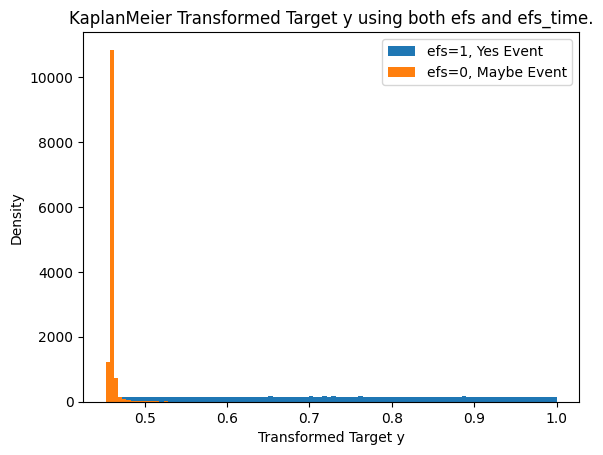

In [37]:
from lifelines import KaplanMeierFitter

def transform_survival_probability(df, time_col='efs_time', event_col='efs'):
    kmf = KaplanMeierFitter()
    kmf.fit(df[time_col], df[event_col])
    y = kmf.survival_function_at_times(df[time_col]).values
    return y
combined_df["y"] = transform_survival_probability(combined_df, time_col='efs_time', event_col='efs')

plt.hist(combined_df.loc[combined_df.efs==1,"y"],bins=100,label="efs=1, Yes Event")
plt.hist(combined_df.loc[combined_df.efs==0,"y"],bins=100,label="efs=0, Maybe Event")
plt.xlabel("Transformed Target y")
plt.ylabel("Density")
plt.title("KaplanMeier Transformed Target y using both efs and efs_time.")
plt.legend()
plt.show()



In [38]:
submission  = combined_df[combined_df['is_train'] == 0 ]
submission.rename(columns = {'y' : 'prediction'} , inplace = True) 

In [39]:
df_sub  = pd.read_csv("/kaggle/input/equity-post-HCT-survival-predictions/test.csv")
sub  = pd.DataFrame()
sub['ID'] = df_sub.ID
sub['prediction'] = submission.prediction.values
sub.to_csv('submission.csv' , index = False)